This programme is meant as a simulator for the spread of genetic trait throughout generations

In [1]:
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import networkx as nx
import networkx.algorithms.community as nx_comm


There are three types of genetic inheritance patterns:
Dominant:  One allele is enough to cause the disease. It inherits in an unbroken line.
Recessive: Two alleles are needed to cause the disease. It can remain hidden in the genome for generations
Polygenetic: These genetic diseases are caused by a complicated interaction between many genes. In this code, Polygenetic is represented by 'cumulative' genes. These genes can increase or decrease the risk of a trait

In [2]:

def get_chromosome_gene_options(num_genes,chromosome_type):
    #mark chromosome
    chromosome = str(chromosome_type)
    chromosome = f"{chromosome}-chromosome"
    num_genes = int(num_genes)

    gene_records = []
    allele_records = []

    #create genes
    base_options = ["A","G","C","T"]
    for i in range(num_genes):
      #create gene ID
      gene_ID = f"{chromosome}_gene_{i+1}"
      #create container and options for bases
      current_gene_alleles = [] # Collect allele IDs for this specific gene
      information_gene = "Placeholder"
      #dominance_recessive = random.choices(['dominant','recessive'],weights=[0.3,0.7])


      #generate alleles for this gene
      for j in range(random.randint(1,12)): # random.randint(1,8) means 1 to 7 alleles per gene
        allel_ID = f"{gene_ID}_allel_{j+1}"

        # Determine dominance and pathology for the current gene
        pathology = random.choices(['pathogenic','benign'],weights=[0.0002,0.9998])
        dominance_recessive = random.choices(['dominant','recessive','cumulative'],weights=[0.1,0.03,0.87])
        dominance_recessive = random.choice(dominance_recessive)
        pathology = random.choice(pathology)
        if dominance_recessive == 'recessive' and pathology == 'pathogenic':
            diseases = random.choices(['Cystic fibrosis','Sickle cell anemia','Albinism'])
            disease = random.choice(diseases)
            points = None
            trait = {disease:points}
        elif dominance_recessive == 'recessive' and pathology == 'benign':
            diseases = random.choices([None, 'Straight hair', "Blue eyes",'Red hair'], weights = [0.97,0.01,0.01,0.01])
            disease = random.choice(diseases)
            points = None
            trait = {disease:points}
        elif dominance_recessive == 'cumulative' and pathology == 'pathogenic':
            diseases = random.choices(['Heart defect','Asthma', "Psoriasis", "Club foot"])
            disease = random.choice(diseases)
            points = random.randint(-3,3)
            trait = {disease:points}
        elif dominance_recessive == 'cumulative' and pathology == 'benign':
            traits = random.choices(['Heigth','Intelligence', 'Left-handedness','Light-dark hair'])
            trait = random.choice(traits)
            if trait == 'Left-handedness':
                points = random.randint(-4,2)
            else:
                points = random.randint(-3,3)
            trait = {trait:points}
        elif dominance_recessive == 'dominant' and pathology == 'pathogenic':
            traits = random.choices(['Huntington','Osteogenesis imperfecta','Polydactyly',"Familial artial fibrillations"])
            trait = random.choice(traits)
            points = None
            trait = {trait:points}
        elif dominance_recessive == 'dominant' and pathology == 'benign':
          trait = {None:None}

        else:
          trait= {None:None}

        num_bases = random.randint(7,9)
        bases = []
        #pick base and add to container
        for k in range(num_bases):
          base = random.choice(base_options)
          bases.append(base)
        #convert list to base sequence
        bases_str = ''.join(bases)


        # Collect allele record
        allele_records.append({
            'chromosome_type_ID': chromosome,
            'gene_ID': gene_ID,
            'allel_ID': allel_ID,
            'Information_allel': trait,
            'bases': bases_str,
            'dominant/recessive': dominance_recessive,
            'pathology': pathology
        })
        current_gene_alleles.append(allel_ID)

      # Collect gene record
      gene_records.append({
          'chromosome_type_ID': chromosome,
          'gene_ID': gene_ID,
          'alleles': current_gene_alleles,
          'information_gene': 'Placeholder'
      })

    x_chromosome_genes_df = pd.DataFrame(gene_records)
    alleles_df = pd.DataFrame(allele_records)

    return x_chromosome_genes_df, alleles_df

In [3]:
#create variations of requested chromosomes to simulate genetic diversity on
#chromosome level
def create_chromosomes(genes, alleles, chrtype, amount):
  #check correctness of request
  chrtype = str(chrtype)
  chrtype = chrtype + "-chromosome"
  amount = int(amount)
  #check correctness of request
  print(f"Generating {amount} {chrtype}s")
  #creating copies of dataframe to prevent unintended inference
  #pre-filtering for relevant information in dataframe if relevant
  #forcing consistency in printed statement and action
  genes = genes.copy()
  genes = genes[genes["chromosome_type_ID"] == chrtype]
  alleles = alleles.copy()
  alleles = alleles[alleles["chromosome_type_ID"] == chrtype]


  #checking dataframes
  #display(len(genes))
  #display(len(alleles))

  #dataframe of generated chromosomes
  #chromosome_options_df = pd.DataFrame(columns=["chromosome_type_id", # Added missing comma
                                                #"chromosome_ID",
                                               # "list_of_selected_alleles"
                                              #  ])

  #initiate generation of chromosome
  list_of_chromosomes =[]
  for i in range(amount):
    #print(i)
    chromosome_type_ID = chrtype
    chromosome_ID = f"{chrtype} {i+1}"
    genes_for_chromosome = {}
    selected_alleles = []
    for index,gene in genes.iterrows():
      gene_id = gene["gene_ID"]
      alleles_for_gene = alleles[alleles["gene_ID"] == gene_id]
      alleles_for_gene = alleles_for_gene["allel_ID"].to_list()
      selected_allel = random.choice(alleles_for_gene)
      selected_alleles.append(selected_allel)
    list_of_chromosomes.append({"chromosome_type_id":chromosome_type_ID,
                                "chromosome_ID":chromosome_ID,
                                "list_of_selected_alleles": selected_alleles})
  chromosome_options_df = pd.DataFrame(list_of_chromosomes)

    #chromosome_options_df.loc[len(chromosome_options_df)] = []

  #print(f"{len(chromosome_options_df)}")
  return chromosome_options_df

In [4]:
x_chromosome_genes_df,x_alleles_df = get_chromosome_gene_options(num_genes=767,chromosome_type="x")
#display(x_chromosome_genes_df)
#display(x_alleles_df)

In [5]:
y_chromosome_genes_df, y_alleles_df = get_chromosome_gene_options(num_genes=100,chromosome_type="y")
#display(y_chromosome_genes_df)
#display(y_alleles_df)

In [6]:
#creating x-chromosomes
x_chromosomes_options_df = create_chromosomes(chrtype='x', amount=50, genes=x_chromosome_genes_df, alleles=x_alleles_df)
#display(x_chromosomes_options_df)

Generating 50 x-chromosomes


In [7]:
#creating y-chromosomes
y_chromosomes_options_df = create_chromosomes(chrtype='y', amount=50, genes=y_chromosome_genes_df, alleles=y_alleles_df)
#display(y_chromosomes_options_df)

Generating 50 y-chromosomes


In [8]:
#create placeholder autosomal chromosome

#create chromosome 1 gene options
chromosome1_genes_df,chromosome1_alleles_df = get_chromosome_gene_options(num_genes=700,
                                                                          chromosome_type="1")

chromosome1_option_df = create_chromosomes(chrtype='1',
                                           amount=80,
                                           genes=chromosome1_genes_df,
                                           alleles=chromosome1_alleles_df
                                           )


Generating 80 1-chromosomes


In [9]:
#create chromosome 2 gene options
chromosome2_genes_df,chromosome2_alleles_df = get_chromosome_gene_options(num_genes=280,
                                                                          chromosome_type="2")


chromosome2_option_df = create_chromosomes(chrtype='2',
                                           amount=70,
                                           genes=chromosome2_genes_df,
                                           alleles=chromosome2_alleles_df
                                           )


Generating 70 2-chromosomes


In [10]:
#create chromosome 3
chromosome3_genes_df,chromosome3_alleles_df = get_chromosome_gene_options(num_genes=280,
                                                                          chromosome_type="3")

chromosome3_option_df = create_chromosomes(chrtype='3',
                                           amount=50,
                                           genes=chromosome3_genes_df,
                                           alleles=chromosome3_alleles_df
                                           )


#create chromosome 4
chromosome4_genes_df,chromosome4_alleles_df = get_chromosome_gene_options(num_genes=630,
                                                                          chromosome_type="4")

chromosome4_option_df = create_chromosomes(chrtype='4',
                                           amount=60,
                                           genes=chromosome4_genes_df,
                                           alleles=chromosome4_alleles_df
                                           )
#create chromosome 5
chromosome5_genes_df,chromosome5_alleles_df = get_chromosome_gene_options(num_genes=405, chromosome_type = '5')

chromosome5_option_df = create_chromosomes(chrtype='5',
                                           amount=50,
                                           genes=chromosome5_genes_df,
                                           alleles=chromosome5_alleles_df
                                            )
#create chromosome 6
chromosome6_genes_df,chromosome6_alleles_df = get_chromosome_gene_options(num_genes=405, chromosome_type = '6')

chromosome6_option_df = create_chromosomes(chrtype='6',
                                           amount=30,
                                           genes=chromosome6_genes_df,
                                           alleles=chromosome6_alleles_df
                                           )
#create chromosome 7
chromosome7_genes_df,chromosome7_alleles_df = get_chromosome_gene_options(num_genes=405, chromosome_type = '7')
chromosome7_option_df = create_chromosomes(chrtype='7',
                                           amount=50,
                                           genes=chromosome7_genes_df,
                                           alleles = chromosome7_alleles_df)

#chromosome 8
chromosome8_genes_df,chromosome8_alleles_df = get_chromosome_gene_options(num_genes=405, chromosome_type = '8')
chromosome8_option_df = create_chromosomes(chrtype='8',
                                           amount=50,
                                           genes=chromosome8_genes_df,
                                           alleles=chromosome8_alleles_df)

#9
chromosome9_genes_df,chromosome9_alleles_df = get_chromosome_gene_options(num_genes=245, chromosome_type = '9')
chromosome9_option_df = create_chromosomes(chrtype='9',
                                           amount=50,
                                           genes=chromosome9_genes_df,
                                           alleles=chromosome9_alleles_df
                                           )
#10
chromosome10_genes_df,chromosome10_alleles_df = get_chromosome_gene_options(num_genes=245, chromosome_type = '10')
chromosome10_option_df = create_chromosomes(chrtype='10',
                                           amount=50,
                                           genes=chromosome10_genes_df,
                                           alleles=chromosome10_alleles_df
                                           )

#11
chromosome11_genes_df,chromosome11_alleles_df = get_chromosome_gene_options(num_genes=2, chromosome_type = '11')
chromosome11_option_df = create_chromosomes(chrtype='11',amount=40,
                                           genes=chromosome11_genes_df,
                                           alleles=chromosome11_alleles_df
                                           )

#12
chromosome12_genes_df,chromosome12_alleles_df = get_chromosome_gene_options(num_genes=208, chromosome_type = '12')
chromosome12_option_df = create_chromosomes(chrtype='12',
                                            amount=80,
                                            genes=chromosome12_genes_df,
                                            alleles=chromosome12_alleles_df
                                            )

#13
chromosome13_genes_df,chromosome13_alleles_df = get_chromosome_gene_options(num_genes=290, chromosome_type = '13')
chromosome13_option_df = create_chromosomes(chrtype='13',
                                            amount=70,
                                            genes=chromosome13_genes_df,
                                            alleles=chromosome13_alleles_df
                                            )

14#
chromosome14_genes_df,chromosome14_alleles_df = get_chromosome_gene_options(num_genes=310, chromosome_type = '14')
chromosome14_option_df = create_chromosomes(chrtype='14',
                                            amount=30,
                                            genes=chromosome14_genes_df,
                                            alleles=chromosome14_alleles_df
                                            )

#15
chromosome15_genes_df,chromosome15_alleles_df = get_chromosome_gene_options(num_genes=310, chromosome_type = '15')
chromosome15_option_df = create_chromosomes(chrtype='15',
                                            amount=35,
                                            genes=chromosome15_genes_df,
                                            alleles=chromosome15_alleles_df
                                            )
#16
chromosome16_genes_df,chromosome16_alleles_df = get_chromosome_gene_options(num_genes=310, chromosome_type = '16')
chromosome16_option_df = create_chromosomes(chrtype='16',
                                            amount=35,
                                            genes=chromosome16_genes_df,
                                            alleles=chromosome16_alleles_df
                                            )

#17
chromosome17_genes_df,chromosome17_alleles_df = get_chromosome_gene_options(num_genes=310, chromosome_type = '17')
chromosome17_option_df = create_chromosomes(chrtype='17',
                                            amount=25,
                                            genes=chromosome17_genes_df,
                                            alleles=chromosome17_alleles_df
                                            )

#18
chromosome18_genes_df,chromosome18_alleles_df = get_chromosome_gene_options(num_genes=370, chromosome_type = '18')
chromosome18_option_df = create_chromosomes(chrtype='18',
                                            amount=25,
                                            genes=chromosome18_genes_df,
                                            alleles=chromosome18_alleles_df
                                            )
#19
chromosome19_genes_df,chromosome19_alleles_df = get_chromosome_gene_options(num_genes=370, chromosome_type = '19')
chromosome19_option_df = create_chromosomes(chrtype='19',
                                            amount=25,
                                            genes=chromosome19_genes_df,
                                            alleles=chromosome19_alleles_df
                                            )
#20
chromosome20_genes_df,chromosome20_alleles_df = get_chromosome_gene_options(num_genes=460, chromosome_type = '20')
chromosome20_option_df = create_chromosomes(chrtype='20',
                                            amount=25,
                                            genes=chromosome20_genes_df,
                                            alleles=chromosome20_alleles_df
                                            )
#21
chromosome21_genes_df,chromosome21_alleles_df = get_chromosome_gene_options(num_genes=435, chromosome_type = '21')
chromosome21_option_df = create_chromosomes(chrtype='21',
                                            amount=25,
                                            genes=chromosome21_genes_df,
                                            alleles=chromosome21_alleles_df
                                            )
#22
chromosome22_genes_df,chromosome22_alleles_df = get_chromosome_gene_options(num_genes=475, chromosome_type = '22')
chromosome22_option_df = create_chromosomes(chrtype='22',
                                            amount=40,
                                            genes=chromosome22_genes_df,
                                            alleles=chromosome22_alleles_df
                                            )



Generating 50 3-chromosomes
Generating 60 4-chromosomes
Generating 50 5-chromosomes
Generating 30 6-chromosomes
Generating 50 7-chromosomes
Generating 50 8-chromosomes
Generating 50 9-chromosomes
Generating 50 10-chromosomes
Generating 40 11-chromosomes
Generating 80 12-chromosomes
Generating 70 13-chromosomes
Generating 30 14-chromosomes
Generating 35 15-chromosomes
Generating 35 16-chromosomes
Generating 25 17-chromosomes
Generating 25 18-chromosomes
Generating 25 19-chromosomes
Generating 25 20-chromosomes
Generating 25 21-chromosomes
Generating 40 22-chromosomes


In [11]:
#get all alleles
alleles_df = pd.concat([x_alleles_df,
                        y_alleles_df,
                        chromosome1_alleles_df,
                        chromosome2_alleles_df,
                        chromosome3_alleles_df,
                        chromosome4_alleles_df,
                        chromosome5_alleles_df,
                        chromosome6_alleles_df,
                        chromosome7_alleles_df,
                        chromosome8_alleles_df,
                        chromosome9_alleles_df,
                        chromosome10_alleles_df,
                        chromosome11_alleles_df,
                        chromosome12_alleles_df,
                        chromosome13_alleles_df,
                        chromosome14_alleles_df,
                        chromosome15_alleles_df,
                        chromosome16_alleles_df,
                        chromosome17_alleles_df,
                        chromosome18_alleles_df,
                        chromosome19_alleles_df,
                        chromosome20_alleles_df,
                        chromosome21_alleles_df,
                        chromosome22_alleles_df
                        ])
print(len(alleles_df))
#get df with all pathological alleles
pathogenic_alleles_df = alleles_df[alleles_df["pathology"] == "pathogenic"]
display(pathogenic_alleles_df)

56589


,chromosome_type_ID,gene_ID,allel_ID,Information_allel,bases,dominant/recessive,pathology
1901,1-chromosome,1-chromosome_gene_299,1-chromosome_gene_299_allel_3,{'Club foot': 3},ACGGGCAAA,cumulative,pathogenic
1530,2-chromosome,2-chromosome_gene_244,2-chromosome_gene_244_allel_1,{'Heart defect': 2},TACCAAT,cumulative,pathogenic
1413,3-chromosome,3-chromosome_gene_214,3-chromosome_gene_214_allel_2,{'Club foot': -3},TATAGGG,cumulative,pathogenic
1415,4-chromosome,4-chromosome_gene_212,4-chromosome_gene_212_allel_6,{'Asthma': 2},AGCGGGTGC,cumulative,pathogenic
3409,4-chromosome,4-chromosome_gene_503,4-chromosome_gene_503_allel_6,{'Psoriasis': 0},TAGACGGGG,cumulative,pathogenic
135,6-chromosome,6-chromosome_gene_23,6-chromosome_gene_23_allel_5,{'Psoriasis': 0},ACCGTAAC,cumulative,pathogenic
765,6-chromosome,6-chromosome_gene_123,6-chromosome_gene_123_allel_3,{'Asthma': 3},GCGCATC,cumulative,pathogenic
1159,7-chromosome,7-chromosome_gene_187,7-chromosome_gene_187_allel_1,{'Psoriasis': 2},TGCACATT,cumulative,pathogenic
152,9-chromosome,9-chromosome_gene_25,9-chromosome_gene_25_allel_2,{'Psoriasis': 3},GTCGTTGAG,cumulative,pathogenic
79,10-chromosome,10-chromosome_gene_11,10-chromosome_gene_11_allel_4,{'Heart defect': 0},GTGCTAC,cumulative,pathogenic


In [12]:
all_chromosomes_df = pd.concat([x_chromosomes_options_df,
                                y_chromosomes_options_df,
                                chromosome1_option_df,
                                chromosome2_option_df,
                                chromosome3_option_df,
                                chromosome4_option_df,
                                chromosome5_option_df,
                                chromosome6_option_df,
                                chromosome7_option_df,
                                chromosome8_option_df,
                                chromosome9_option_df,
                                chromosome10_option_df,
                                chromosome11_option_df,
                                chromosome12_option_df,
                                chromosome13_option_df,
                                chromosome14_option_df,
                                chromosome15_option_df,
                                chromosome16_option_df,
                                chromosome17_option_df,
                                chromosome18_option_df,
                                chromosome19_option_df,
                                chromosome20_option_df,
                                chromosome21_option_df,
                                chromosome22_option_df
                                ])
#display(all_chromosomes_df)

In [13]:

def get_chromosome_gene_options(num_genes,chromosome_type):
    #mark chromosome
    chromosome = str(chromosome_type)
    chromosome = f"{chromosome}-chromosome"
    num_genes = int(num_genes)

     #create df with genes and list of alleles
     #functions as interim fact
    x_chromosome_genes_df = pd.DataFrame(columns=[
                                             'chromosome_type_ID',
                                             'gene_ID',
                                             'alleles',
                                             'information_gene'
                                             ])
    #functions as data dimension
    alleles_df = pd.DataFrame(columns=[
                                    "chromosome_type_ID",
                                    "gene_ID",
                                    'allel_ID',
                                    "Information_allel",
                                    'bases',
                                    'dominant/recessive',
                                    'pathology'
                                    ])
     #create genes
    base_options = ["A","G","C","T"]
    for i in range(num_genes):
      #create gene ID
      gene_ID = f"{chromosome}_gene_{i+1}"
      #create container and options for bases
      alleles = []
      base_options = ["A", "C", "G", "T"]
      information_gene = "Placeholder"
      dominance_levels = ['dominant','recessive']
      dominance_recessive = random.choice(dominance_levels)
      pathology_levels = ['pathogenic','benign']
      pathology = random.choice(pathology_levels)
      if i % 2 == 0 or i % 3 == 0:
        pathology = 'benign'
      #generate alleles
      for j in range(random.randint(1,15)):
        allel_ID = f"{gene_ID}_allel_{j+1}"
        bases = []
        #pick base and add to container
        for k in range(random.randint(1,15)):
          base = random.choice(base_options)
          bases.append(base)
        #convert list to base sequence
        bases = ''.join(bases)


        information_allel = "Placeholder"
        # add to list
        alleles.append(allel_ID)
        alleles_df.loc[len(alleles_df)] = [chromosome,
                                     gene_ID,
                                     allel_ID,
                                     information_gene,
                                     bases,
                                     dominance_recessive,
                                     pathology
                                     ]
      # add information, including list of alleles in single column
      x_chromosome_genes_df.loc[len(x_chromosome_genes_df)] = [chromosome,
                                                   gene_ID,
                                                   alleles,
                                                   information_allel
                                                   ]


    return x_chromosome_genes_df, alleles_df

In [14]:
def create_start_population(population_size,chromosome_options_df):
  Generation_ID = 0
  chromosome_options_df = chromosome_options_df.copy()
  unique_chrtypes = chromosome_options_df["chromosome_type_id"].unique() # FIX: Call unique() as a method

  #Allosamal
  allosomal_df = chromosome_options_df[chromosome_options_df["chromosome_type_id"].str.contains('y', na=False) |
                                       chromosome_options_df["chromosome_type_id"].str.contains('x', na=False)  ]

  #autosomal
  autosomal_df = chromosome_options_df[~chromosome_options_df['chromosome_type_id'].isin(allosomal_df['chromosome_type_id'])]
  autosomal_unique = autosomal_df["chromosome_type_id"].unique()
  print(autosomal_unique)


  #person df
  person_df = pd.DataFrame(columns=['Generation_ID',
                                    'person_ID',
                                    'list_chromosomes',
                                    #'alleles',
                                    'sex',
                                    'homozygous%',
                                    'incest coefficient',
                                    'age',
                                    'parents',
                                    'grandparents',
                                    'greatgrandparents',
                                    'great-greatgrandparents',
                                    'Common ancestors'
                                    ])

  # Initialize allel_dim_df outside the loop
  allel_dim_df = pd.DataFrame(columns=['Generation_ID',"person_ID", "alleles"])

  #initiate person generation
  for i in range(population_size):
    person_id = f"{Generation_ID}_person_{i}"
    chromosomes = []
    list_of_alleles_raw = [] # To store list of alleles for each chromosome pair, before flattening

    total_gene_loci = 0
    homozygous_gene_loci = 0

    #autosomal genes
    for chr_type in autosomal_unique:
      possible_chromosomes = chromosome_options_df[chromosome_options_df["chromosome_type_id"] == chr_type]["chromosome_ID"].to_list()

      if not possible_chromosomes: # Ensure there are chromosomes to pick from
          print(f"Warning: No possible chromosomes found for type {chr_type}. Skipping.")
          continue

      selected_chromosome_1 = random.choice(possible_chromosomes)
      selected_chromosome_2 = random.choice(possible_chromosomes)
      chromosomes.append([selected_chromosome_1,selected_chromosome_2])

      # Get the list of selected alleles for each chosen chromosome for homozygosity check
      alleles_from_chr1_list = chromosome_options_df[chromosome_options_df["chromosome_ID"] == selected_chromosome_1]["list_of_selected_alleles"].iloc[0]
      alleles_from_chr2_list = chromosome_options_df[chromosome_options_df["chromosome_ID"] == selected_chromosome_2]["list_of_selected_alleles"].iloc[0]

      list_of_alleles_raw.append([alleles_from_chr1_list, alleles_from_chr2_list]) # Store the pair of allele lists

      # Calculate homozygosity for this autosomal pair
      for k in range(len(alleles_from_chr1_list)): # Assuming lists are of same length and ordered by gene
          total_gene_loci += 1
          if alleles_from_chr1_list[k] == alleles_from_chr2_list[k]:
              homozygous_gene_loci += 1

    #allosomal genes
    for _ in range(1): # Iterate once for sex chromosomes
      x_chromosome_options = chromosome_options_df[chromosome_options_df["chromosome_type_id"].str.contains('x', na=False)]
      y_chromosome_options = chromosome_options_df[chromosome_options_df["chromosome_type_id"].str.contains('y', na=False)]

      # Get IDs as lists, ensure they are not empty before choosing
      x_ids = x_chromosome_options["chromosome_ID"].tolist()
      y_ids = y_chromosome_options["chromosome_ID"].tolist()

      chromosome_1 = None
      chromosome_2 = None
      sex = "Unknown"

      if x_ids and y_ids: # Both X and Y available
          # Randomly assign male or female
          if random.choice([True, False]): # True for male, False for female
              sex = "Male"
              chromosome_1 = random.choice(x_ids)
              chromosome_2 = random.choice(y_ids)
          else:
              sex = "Female"
              chromosome_1 = random.choice(x_ids)
              chromosome_2 = random.choice(x_ids) # Females have two X
      elif x_ids: # Only X available (e.g., if only female possible, or just incomplete data)
          sex = "Female"
          chromosome_1 = random.choice(x_ids)
          chromosome_2 = random.choice(x_ids)
      elif y_ids: # Only Y available (unlikely for viable person, but handle)
          sex = "Male" # Assume male if only Y is found, and assign a placeholder X
          chromosome_1 = "No X Available"
          chromosome_2 = random.choice(y_ids)
      else: # No sex chromosomes available
          sex = "Unknown"
          chromosome_1 = "No X Available"
          chromosome_2 = "No Y Available"

      chromosomes.append([chromosome_1,chromosome_2])

      # Collect alleles for sex chromosomes for later flattening
      alleles_from_chr1_sex_list = chromosome_options_df[chromosome_options_df["chromosome_ID"] == chromosome_1]["list_of_selected_alleles"].iloc[0] if chromosome_1 != "No X Available" else []
      alleles_from_chr2_sex_list = chromosome_options_df[chromosome_options_df["chromosome_ID"] == chromosome_2]["list_of_selected_alleles"].iloc[0] if chromosome_2 != "No Y Available" else []

      list_of_alleles_raw.append([alleles_from_chr1_sex_list, alleles_from_chr2_sex_list]) # Store the pair of allele lists

      # Calculate homozygosity for sex chromosomes
      if sex == "Female": # XX
          if chromosome_1 != "No X Available" and chromosome_2 != "No X Available":
              for k in range(len(alleles_from_chr1_sex_list)): # Assuming lists are of same length and ordered by gene
                  total_gene_loci += 1
                  if alleles_from_chr1_sex_list[k] == alleles_from_chr2_sex_list[k]:
                      homozygous_gene_loci += 1
      elif sex == "Male": # XY
          # For males, X-linked and Y-linked genes are typically considered hemizygous if comparing X to Y,
          # meaning they don't contribute to the 'homozygous' count as they only have one allele copy.
          # However, they still contribute to the 'total' gene count for the person.
          if chromosome_1 != "No X Available":
              total_gene_loci += len(alleles_from_chr1_sex_list)
          if chromosome_2 != "No Y Available":
              total_gene_loci += len(alleles_from_chr2_sex_list)


    # Flatten list_of_alleles_raw for the person_df 'alleles' entry
    flattened_alleles = [allele for sublist_of_lists in list_of_alleles_raw for sublist in sublist_of_lists for allele in sublist]

    # Calculate homozygous percentage
    if total_gene_loci > 0:
        homozygousperc = (homozygous_gene_loci / total_gene_loci) * 100
        homozygousperc = round(homozygousperc, 1)
    else:
        homozygousperc = 0


    person_df.loc[len(person_df)] = [Generation_ID,
                                    person_id,
                                    chromosomes,
                                    #  flattened_alleles, # Use the flattened list of alleles
                                     sex,
                                     homozygousperc,
                                     0,
                                     20,
                                     [],
                                     [],
                                     [],
                                     [],
                                     []]

    # Add to allel_dim_df after populating person_df
    allel_dim_df.loc[len(allel_dim_df)] = [Generation_ID,
                                          person_id,
                                          flattened_alleles]

  return person_df, allel_dim_df

In [15]:
 #create population
population_df,allel_dim_df = create_start_population(population_size=3,chromosome_options_df=all_chromosomes_df)
display(population_df)
#display(allel_dim_df)

['1-chromosome' '2-chromosome' '3-chromosome' '4-chromosome'
 '5-chromosome' '6-chromosome' '7-chromosome' '8-chromosome'
 '9-chromosome' '10-chromosome' '11-chromosome' '12-chromosome'
 '13-chromosome' '14-chromosome' '15-chromosome' '16-chromosome'
 '17-chromosome' '18-chromosome' '19-chromosome' '20-chromosome'
 '21-chromosome' '22-chromosome']


,Generation_ID,person_ID,list_chromosomes,sex,homozygous%,incest coefficient,age,parents,grandparents,greatgrandparents,great-greatgrandparents,Common ancestors
0,0,0_person_0,"[[1-chromosome 15, 1-chromosome 38], [2-chromo...",Female,27.9,0,20,[],[],[],[],[]
1,0,0_person_1,"[[1-chromosome 4, 1-chromosome 76], [2-chromos...",Male,26.9,0,20,[],[],[],[],[]
2,0,0_person_2,"[[1-chromosome 72, 1-chromosome 35], [2-chromo...",Male,22.9,0,20,[],[],[],[],[]


In [16]:
def matchmaker(new_pop_size,population_df,allel_dim_df, generation_num,chromosome_options_df):
  print("Function intiatied")
  Generation_ID = int(generation_num)

  # Optimize: Create a set of person IDs for faster lookups in genealogy
  population_person_ids_set = set(population_df['person_ID'].values)

  # Optimize: Create a dict/Series for chromosome_options_df for faster allele lookups
  # This maps chromosome_ID to its list_of_selected_alleles
  chromosome_alleles_lookup = chromosome_options_df.set_index('chromosome_ID')['list_of_selected_alleles'].to_dict()

  population_df_local = population_df.copy() # Use a local copy to avoid modifying the original during parent selection
  population_df_local = population_df_local[population_df_local["age"] < 60] # Filter fertile population


  temp_new_population_records = []
  temp_new_allel_dim_records = []

  female_pop = population_df_local[population_df_local["sex"] == "Female"]
  male_pop = population_df_local[population_df_local["sex"] == "Male"]

  total_incest_blocks = 0 # Initialize a cumulative counter for incest blocks
  # Initialize cumulative counters for the generation, to be printed at the end
  cousins_matched_total = 0
  uncle_aunt_matched_total = 0
  extended_aunt_uncle_matched_total = 0

  for i in range(new_pop_size):
    # Check if there are enough males and females to create a new person
    if female_pop.empty or male_pop.empty:
        print(f"Warning: Not enough males or females in population to create new generation {generation_num}. Skipping remaining individuals.")
        break
    person_ID = f'{Generation_ID}_person_{i}' # Corrected to use Generation_ID

    blocked_attempts_for_current_person = 0 # Counter for blocked attempts for the current person
    # These are counters for the *current attempt* to find a partner for *this single person*
    # They should be reset for each 'person_ID' and then added to the total cumulative counts.
    current_person_cousin_matches = 0
    current_person_uncle_aunt_matches = 0
    current_person_extended_aunt_uncle_matches = 0

    # Loop until a valid, non-incestuous pair is found
    #This codes assumes that any union as close as first cousins or closer does not occur
    #If relevant, this can be adjusted. Tracking mechanisms are already present in the code for this user case
    while True:
        mother_ID = random.choice(female_pop["person_ID"].to_list())
        father_ID = random.choice(male_pop["person_ID"].to_list())

        # Fetch parent data for current potential pair from the filtered population_df_local
        mother_data = population_df_local[population_df_local["person_ID"] == mother_ID].iloc[0]
        father_data = population_df_local[population_df_local["person_ID"] == father_ID].iloc[0]

        # Use sets for efficient intersection checks of ancestors
        mother_parents_set = set(mother_data["parents"])
        father_parents_set = set(father_data["parents"])
        mother_grandparents_set = set(mother_data["grandparents"])
        father_grandparents_set = set(father_data["grandparents"])
        # Corrected column name to 'greatgrandparents' (without underscore)
        mother_greatgrandparents_set = set(mother_data["greatgrandparents"])
        father_greatgrandparents_set = set(father_data["greatgrandparents"])

        # Incest check 1: Parent-Child
        if mother_ID in father_parents_set or father_ID in mother_parents_set:
            blocked_attempts_for_current_person += 1
            continue # Try another pair

        # Incest check 2: Full Siblings (share same parents)
        if mother_parents_set and mother_parents_set == father_parents_set:
            blocked_attempts_for_current_person += 1
            continue # Try another pair

        # Incest check 3: Half Siblings (share one common parent)
        if len(mother_parents_set.intersection(father_parents_set)) > 0:
            blocked_attempts_for_current_person += 1
            continue # Try another pair

        # Incest check 4: Uncle/Aunt-Niece/Nephew
        # Check if one parent is a direct grandparent of the other (e.g., mother's parent is father's grandparent)
        if (mother_ID in father_grandparents_set) or \
           (father_ID in mother_grandparents_set):
             current_person_uncle_aunt_matches += 1 # Accumulate for current person
             
             continue # Try another pair

        # Incest check 5: First Cousins (share common grandparents)
        common_grandparents_intersection = mother_grandparents_set.intersection(father_grandparents_set)
        if len(common_grandparents_intersection) > 0: # Blocks if they share any grandparents (half or full first cousins)
            current_person_cousin_matches += 1 # Accumulate for current person
    
            continue # Try another pair


        # Incest check 6: Great-Uncle/Great-Aunt - Grandniece/Grandnephew
        # If any of the mother's grandparents are also father's great-grandparents, or vice versa
        if len(mother_grandparents_set.intersection(father_greatgrandparents_set)) > 0 or \
           len(father_greatgrandparents_set.intersection(mother_grandparents_set)) > 0:
            current_person_extended_aunt_uncle_matches += 1 # Accumulate for current person
            continue

        # If all checks pass, break the inner loop and proceed with these parents
        break

    # Add blocked attempts for this person to the total cumulative count
    total_incest_blocks += blocked_attempts_for_current_person
    # Accumulate person-specific matches to generation totals
    cousins_matched_total += current_person_cousin_matches
    uncle_aunt_matched_total += current_person_uncle_aunt_matches
    extended_aunt_uncle_matched_total += current_person_extended_aunt_uncle_matches

    # Now we have selected valid parents (mother_ID, father_ID)
    # The parent_data (mother_data, father_data) holds the details of the selected parents from the last successful check.
    # We will use these details to generate the new individual.

    mother_chromosomes = mother_data["list_chromosomes"]
    mother_parents_list = mother_data["parents"] # Keep as list for new person's parents field
    mother_grandparents_list = mother_data["grandparents"]
    mother_greatgrandparents_list = mother_data['greatgrandparents'] # Corrected column name

    father_chromosomes = father_data["list_chromosomes"]
    father_parents_list = father_data["parents"]
    father_grandparents_list = father_data["grandparents"]
    father_greatgrandparents_list = father_data['greatgrandparents'] # Corrected column name

    # Calculate inbreeding coefficient for this specific pair based on shared great-grandparents
    inbreeding_coefficient = 0
    current_greatgrandparents_combined = mother_greatgrandparents_list + father_greatgrandparents_list
    if current_greatgrandparents_combined: # Ensure the list is not empty to avoid division by zero
        unique_great_grandparents = set(current_greatgrandparents_combined)
        ratio = len(unique_great_grandparents) / len(current_greatgrandparents_combined)
        inbreeding_coefficient = round((1 - ratio), 2)
    else:
        inbreeding_coefficient = 0 # No great-grandparents recorded, so no inbreeding from this lineage depth

    # split list of total chromosomes in chromosome pairs
    mother_chromosomes_pairs = []
    for pair in mother_chromosomes:
      loc_gen = random.randint(0,1)
      mother_chromosomes_pairs.append(pair[loc_gen])

    father_chromosomes_pairs = []
    for pair in father_chromosomes:
      loc_gen = random.randint(0,1)
      father_chromosomes_pairs.append(pair[loc_gen])

    # Re-introduce logic to pair up inherited chromosomes for new_person_chromosomes_list
    number_chromosomes_mother = len(mother_chromosomes_pairs)
    number_chromosomes_father = len(father_chromosomes_pairs)

    new_person_chromosomes_list = [] # This will be the list of lists for 'list_chromosomes'
    new_genome_chromosomes_ids_flat = [] # This will be the flat list for allele lookups

    if number_chromosomes_mother != number_chromosomes_father:
      print("Error: Mismatched number of inherited chromosome types from parents.")
      min_len = min(number_chromosomes_mother, number_chromosomes_father)
      for j in range(min_len):
          mother_chromosome = mother_chromosomes_pairs[j]
          father_chromosome = father_chromosomes_pairs[j]
          chromosome_pair_for_display = [mother_chromosome, father_chromosome]
          new_person_chromosomes_list.append(chromosome_pair_for_display)
          new_genome_chromosomes_ids_flat.extend(chromosome_pair_for_display)
    else:
      for j in range(number_chromosomes_mother):
        mother_chromosome = mother_chromosomes_pairs[j]
        father_chromosome = father_chromosomes_pairs[j]

        chromosome_pair_for_display = [mother_chromosome, father_chromosome]
        new_person_chromosomes_list.append(chromosome_pair_for_display)

        new_genome_chromosomes_ids_flat.extend(chromosome_pair_for_display)

    # Sex determination based on father's inherited sex chromosome
    father_inherited_sex_chr = father_chromosomes_pairs[-1] # Assuming last chromosome is sex chromosome
    if 'y' in father_inherited_sex_chr.lower():
        sex = 'Male'
    else:
        sex = 'Female'

    #retrieve matching alleles from chromosome_options_df
    new_alleles_list_of_lists = [] # This will be a list of lists, where each inner list contains alleles for one inherited chromosome
    for chr_id in new_genome_chromosomes_ids_flat: # Iterate over individual chromosome IDs (flattened list)
      if "No X Available" not in str(chr_id) and "No Y Available" not in str(chr_id):
          # Optimize: Use the pre-created lookup dictionary for speed
          allels_list = chromosome_alleles_lookup.get(chr_id, [])
          new_alleles_list_of_lists.append(allels_list)
      else:
          new_alleles_list_of_lists.append([]) # Append empty list for placeholder chromosomes

    #homozogity calculations
    total_gene_loci = 0
    homozygous_gene_loci = 0

    # Calculate homozygosity per gene locus by comparing alleles within each pair in new_person_chromosomes_list
    for chr_pair in new_person_chromosomes_list:
        chr1_id, chr2_id = chr_pair

        alleles_list_chr1 = []
        if "No X Available" not in str(chr1_id) and "No Y Available" not in str(chr1_id):
            alleles_list_chr1 = chromosome_alleles_lookup.get(chr1_id, [])

        alleles_list_chr2 = []
        if "No X Available" not in str(chr2_id) and "No Y Available" not in str(chr2_id):
            alleles_list_chr2 = chromosome_alleles_lookup.get(chr2_id, [])

        # Ensure we only compare alleles if both chromosomes in the pair actually exist and have alleles
        if len(alleles_list_chr1) > 0 and len(alleles_list_chr2) > 0:
            min_len_alleles = min(len(alleles_list_chr1), len(alleles_list_chr2))
            for k in range(min_len_alleles):
                total_gene_loci += 1
                if alleles_list_chr1[k] == alleles_list_chr2[k]:
                    homozygous_gene_loci += 1
        elif len(alleles_list_chr1) > 0: # If only one chromosome has alleles (e.g., male XY where X has genes, Y might not for some loci)
             total_gene_loci += len(alleles_list_chr1)
        elif len(alleles_list_chr2) > 0:
             total_gene_loci += len(alleles_list_chr2)

    if total_gene_loci > 0:
        homozygosity = (homozygous_gene_loci / total_gene_loci) * 100
        homozygosity = round(homozygosity, 1)
    else:
        homozygosity = 0

    #genealogy registration
    list_parents = [mother_ID,father_ID]

    # Grandparents are the unique parents of the selected mother and father
    grandparents = list(mother_parents_set.union(father_parents_set))

    # Great-grandparents are the unique grandparents of the selected mother and father
    great_grandparents = list(mother_grandparents_set.union(father_grandparents_set))

    #great-great-grandparents
    great_great_grandparents = list(mother_greatgrandparents_set.union(father_greatgrandparents_set))

    # Calculate common ancestors by intersecting the full ancestral lines of both parents
    # This includes parents, grandparents, and great-grandparents of each parent.
    ancestors_of_mother = set(mother_data['parents']).union(mother_data['grandparents']).union(mother_data['greatgrandparents'])
    ancestors_of_father = set(father_data['parents']).union(father_data['grandparents']).union(father_data['greatgrandparents'])

    common_ancestors = list(ancestors_of_mother.intersection(ancestors_of_father))


    # Optimize: Collect record in list instead of appending to DataFrame row-by-row
    temp_new_population_records.append({
        'Generation_ID': Generation_ID,
        'person_ID': person_ID,
        'list_chromosomes': new_person_chromosomes_list,
        'sex': sex,
        'homozygous%': round(homozygosity,1),
        'incest coefficient': inbreeding_coefficient, # Corrected assignment
        'age': 20,
        'parents': list_parents,
        'grandparents': grandparents,
        'greatgrandparents': great_grandparents,
        'great-greatgrandparents': great_great_grandparents,
        'Common ancestors': common_ancestors
    })

    # Flatten new_alleles_list_of_lists for the allel_dim_df 'alleles' entry
    flat_new_alleles_for_allel_dim = [allele for sublist in new_alleles_list_of_lists for allele in sublist]
    temp_new_allel_dim_records.append({"Generation_ID":Generation_ID, "person_ID": person_ID, "alleles": flat_new_alleles_for_allel_dim})

  new_population_df = pd.DataFrame(temp_new_population_records, columns=population_df.columns)
  new_allel_dim_df = pd.DataFrame(temp_new_allel_dim_records)
  print(f'Total incestuous pairs blocked for this generation: {total_incest_blocks}')
  print(f'cousin pairs allowed {cousins_matched_total}') # Use cumulative total
  print(f'Aunt/uncle,niece/nephew pairs allowed {uncle_aunt_matched_total}') # Use cumulative total
  print(f'extended aunt/uncle pairs allowed {extended_aunt_uncle_matched_total}') # Use cumulative total

  return new_population_df, new_allel_dim_df

In [17]:
def chrom_crossover(population_df_input, all_chromosomes_options_df_input, full_alleles_detail_df_input):
  population_df = population_df_input.copy()
  all_chromosomes_options_df = all_chromosomes_options_df_input.copy()
  full_alleles_detail_df = full_alleles_detail_df_input.copy() # Not directly used in simple segment exchange, but kept for context

  # Pre-create a lookup for chromosome_ID to its list_of_selected_alleles for efficiency
  chromosome_alleles_lookup = all_chromosomes_options_df.set_index('chromosome_ID')['list_of_selected_alleles'].to_dict()

  newly_generated_chromosomes = [] # To store new chromosomes created during crossover

  # Iterate over people in the fertile age range
  for index_person, row_person in population_df[population_df['age']<50].iterrows():
    person_id = row_person['person_ID']
    # Ensure we get the actual list of chromosome pairs, not a Series
    person_chromosomes_pairs_list = row_person['list_chromosomes']

    # Each person can have multiple crossover events
    for i in range(random.randint(1, 5)): # Reduced range to avoid excessive new chromosomes for testing
      if not person_chromosomes_pairs_list:
          continue # Skip if person has no chromosomes

      # Select a random *pair* of homologous chromosomes from the person's genome
      # A pair looks like [chromosome_ID_A, chromosome_ID_B]
      selected_chromosome_pair_from_person = random.choice(person_chromosomes_pairs_list)

      if len(selected_chromosome_pair_from_person) != 2:
          # This should not happen if `create_start_population` generates valid pairs
          continue

      chrom_A_ID = selected_chromosome_pair_from_person[0]
      chrom_B_ID = selected_chromosome_pair_from_person[1]

      # Retrieve the full list of alleles for each chromosome from the lookup
      # Handle cases where chromosome_ID might be a placeholder like "No X Available"
      alleles_A = chromosome_alleles_lookup.get(chrom_A_ID, [])
      alleles_B = chromosome_alleles_lookup.get(chrom_B_ID, [])

      # If either chromosome in the pair is a placeholder or has no alleles, skip crossover for this pair
      if not alleles_A or not alleles_B or len(alleles_A) != len(alleles_B):
          continue # Cannot perform meaningful crossover if lengths differ or empty

      num_genes_in_pair = len(alleles_A)
      if num_genes_in_pair < 2:
          continue # Need at least 2 genes for crossover to make sense

      # Choose a random crossover point (gene index)
      crossover_point = random.randint(1, num_genes_in_pair - 1) # Must be between 1 and num_genes-1

      # Perform crossover:
      # Randomly decide the direction of crossover: first part from A, second part from B OR vice-versa
      if random.choice([True, False]):
          new_alleles_list = alleles_A[:crossover_point] + alleles_B[crossover_point:]
      else:
          new_alleles_list = alleles_B[:crossover_point] + alleles_A[crossover_point:]

      # Create a new unique chromosome ID
      # We need to ensure new_chromosome_ID is unique across all_chromosomes_options_df
      # Use a counter for uniqueness and denote it as a crossover product
      new_chrom_count = len(all_chromosomes_options_df) + len(newly_generated_chromosomes) + 1
      # Assuming chromosome type can be extracted from the ID (e.g., "x-chromosome" from "x-chromosome 1")
      new_chromosome_type_id = chrom_A_ID.split(' ')[0] if ' ' in chrom_A_ID else chrom_A_ID # e.g. "x-chromosome" or "1-chromosome"
      new_chromosome_ID = f"{new_chromosome_type_id}_{new_chrom_count}_crossover"

      # Add the new chromosome to our collection of newly generated chromosomes
      newly_generated_chromosomes.append({
          'chromosome_type_id': new_chromosome_type_id,
          'chromosome_ID': new_chromosome_ID,
          'list_of_selected_alleles': new_alleles_list
      })

      # Now, update the person's list_of_chromosomes in population_df
      # Replace one of the original chromosomes in the selected pair with the new one
      # We need to find the exact position of the selected_chromosome_pair_from_person in person_chromosomes_pairs_list
      for idx, pair in enumerate(person_chromosomes_pairs_list):
          if pair == selected_chromosome_pair_from_person:
              # Randomly decide which of the two original chromosomes to replace
              if random.choice([True, False]): # Replace chrom_A
                  person_chromosomes_pairs_list[idx][0] = new_chromosome_ID
              else: # Replace chrom_B
                  person_chromosomes_pairs_list[idx][1] = new_chromosome_ID
              break # Found and replaced the pair, move to next crossover event for this person

    # Update the person's chromosomes in the main DataFrame after all crossover events for them
    population_df.at[index_person, 'list_chromosomes'] = person_chromosomes_pairs_list


  # Concatenate newly generated chromosomes to the main all_chromosomes_options_df
  if newly_generated_chromosomes:
      new_chromosomes_df = pd.DataFrame(newly_generated_chromosomes)
      all_chromosomes_options_df = pd.concat([all_chromosomes_options_df, new_chromosomes_df], ignore_index=True)

  # Note: The 'allel_df' (full_alleles_detail_df_input) is not modified by this simple crossover logic
  # as it only deals with combining existing alleles, not creating new ones.
  return population_df, all_chromosomes_options_df, full_alleles_detail_df_input


In [18]:
def allel_mutator(population_df_input, chromosomes_df_input, alleles_df_input):
    population_df = population_df_input.copy()
    chromosomes_df = chromosomes_df_input.copy()
    alleles_df = alleles_df_input.copy()

    # Filter for fertile individuals (age < 50)
    fertile_population_df = population_df[population_df['age'] < 50]

    base_options = ["A", "G", "C", "T"]

    # Pre-create lookups for efficiency
    # chrom_id -> list_of_selected_alleles
    chromosome_alleles_lookup = chromosomes_df.set_index('chromosome_ID')['list_of_selected_alleles'].to_dict()
    # allel_id -> full allele details (dict)
    allele_details_lookup = alleles_df.set_index('allel_ID').to_dict('index')

    newly_mutated_alleles_records = []
    # Using a dictionary to track updated chromosome allele lists and new chromosomes
    # chrom_ID -> updated_list_of_selected_alleles
    # This will eventually be used to reconstruct the `chromosomes_df`
    updated_chromosome_alleles_during_mutation = {k: list(v) for k, v in chromosome_alleles_lookup.items()}

    # Iterate over rows of the filtered population
    for index_person, row_person in fertile_population_df.iterrows():
        person_id = row_person['person_ID']
        person_chromosomes_pairs = list(row_person['list_chromosomes']) # Get the list of [chr_A, chr_B] pairs

        # Flatten the list of chromosome pairs to get all individual chromosome IDs this person has
        all_individual_chrom_ids_for_person = [
            chr_id for pair in person_chromosomes_pairs for chr_id in pair
            if "No X Available" not in str(chr_id) and "No Y Available" not in str(chr_id)
        ]

        if not all_individual_chrom_ids_for_person:
            continue # Skip this person if they have no valid chromosomes to mutate

        # Each person can have a few mutations
        for _ in range(random.randint(1, 3)): # Limiting to 1-3 mutations per person per generation
            if not all_individual_chrom_ids_for_person: # Check again if it became empty due to mutations removing all valid ones
                continue

            # Select a random chromosome from the person's individual chromosomes
            chromosome_ID_to_mutate = random.choice(all_individual_chrom_ids_for_person)

            # Get the current alleles list for this chromosome from our tracking dictionary
            # It might have been updated already if another mutation happened on the same chromosome for this person
            alleles_on_chromosome = updated_chromosome_alleles_during_mutation.get(chromosome_ID_to_mutate)

            if not alleles_on_chromosome or not isinstance(alleles_on_chromosome, list) or not alleles_on_chromosome:
                continue # Skip if no alleles or not a list

            # Choose a random allele (by its index in the list) on this chromosome
            allele_index_to_mutate = random.randint(0, len(alleles_on_chromosome) - 1)
            allel_ID_to_mutate = alleles_on_chromosome[allele_index_to_mutate]

            # Get details of the allele from the global alleles_df lookup
            current_allele_details = allele_details_lookup.get(allel_ID_to_mutate)
            if not current_allele_details or 'bases' not in current_allele_details:
                continue # Should not happen if data is consistent

            old_bases_str = current_allele_details['bases']
            bases_list = list(old_bases_str) # Convert string to mutable list of characters

            if not bases_list:
                continue # No bases to mutate

            position_base = random.randint(0, len(bases_list) - 1)
            new_base_char = random.choice(base_options)

            # Execute mutation
            bases_list[position_base] = new_base_char
            new_bases_str = ''.join(bases_list)

            if new_bases_str != old_bases_str:
                # A mutation occurred, create a new allele entry
                gene_ID = current_allele_details['gene_ID']
                chromosome_type_ID = current_allele_details['chromosome_type_ID']

                # Generate a unique ID for the new allele
                # Use a counter for uniqueness and denote it as a mutation
                new_allel_ID = f"{gene_ID}_mut_{len(newly_mutated_alleles_records)}_{random.randint(1000, 9999)}"

                # Determine dominance and pathology for the new allele (same logic as get_chromosome_gene_options)
                pathology = random.choices(['pathogenic', 'benign'], weights=[0.0002, 0.9998])[0]
                dominance_recessive = random.choices(['dominant', 'recessive', 'cumulative'], weights=[0.1, 0.03, 0.87])[0]

                trait = {None: None}
                if dominance_recessive == 'recessive' and pathology == 'pathogenic':
                    diseases = random.choices(['Cystic fibrosis', 'Sickle cell anemia', 'Albinism'])[0]
                    trait = {diseases: None}
                elif dominance_recessive == 'recessive' and pathology == 'benign':
                    diseases = random.choices([None, 'Straight hair', "Blue eyes", 'Red hair'], weights=[0.97, 0.01, 0.01, 0.01])[0]
                    trait = {diseases: None}
                elif dominance_recessive == 'cumulative' and pathology == 'pathogenic':
                    diseases = random.choices(['Heart defect', 'Asthma', "Psoriasis", "Club foot"])[0]
                    points = random.randint(-3, 3)
                    trait = {diseases: points}
                elif dominance_recessive == 'cumulative' and pathology == 'benign':
                    traits_list = ['Heigth', 'Intelligence', 'Left-handedness', 'Light-dark hair']
                    trait_name = random.choices(traits_list)[0]
                    if trait_name == 'Left-handedness':
                        points = random.randint(-4, 2)
                    else:
                        points = random.randint(-3, 3)
                    trait = {trait_name: points}
                elif dominance_recessive == 'dominant' and pathology == 'pathogenic':
                    traits_list = ['Huntington', 'Osteogenesis imperfecta', 'Polydactyly', "Familial artial fibrillations"]
                    trait_name = random.choices(traits_list)[0]
                    trait = {trait_name: None}
                # For dominant/benign, trait remains {None: None} as per original logic

                # Add the new allele to the list of newly mutated alleles
                newly_mutated_alleles_records.append({
                    'chromosome_type_ID': chromosome_type_ID,
                    'gene_ID': gene_ID,
                    'allel_ID': new_allel_ID,
                    'Information_allel': trait,
                    'bases': new_bases_str,
                    'dominant/recessive': dominance_recessive,
                    'pathology': pathology
                })
                # Update the allele_details_lookup with the new allele immediately for consistent lookups
                allele_details_lookup[new_allel_ID] = {
                    'chromosome_type_ID': chromosome_type_ID,
                    'gene_ID': gene_ID,
                    'allel_ID': new_allel_ID,
                    'Information_allel': trait,
                    'bases': new_bases_str,
                    'dominant/recessive': dominance_recessive,
                    'pathology': pathology
                }


                # Now, update the chromosome's allele list to include the new allele (replacing the old one)
                # This should be done on a *copy* of the list from updated_chromosome_alleles_during_mutation
                updated_alleles_on_chromosome_list = list(alleles_on_chromosome) # Make sure it's a new list object
                updated_alleles_on_chromosome_list[allele_index_to_mutate] = new_allel_ID

                # Create a new chromosome ID for this newly mutated chromosome
                # Ensure uniqueness by appending a mutation counter and random number
                new_chromosome_ID = f"{chromosome_ID_to_mutate}_mut_{len(newly_mutated_alleles_records)}_{random.randint(1000, 9999)}"

                # Update the tracking dictionary for chromosomes
                updated_chromosome_alleles_during_mutation[new_chromosome_ID] = updated_alleles_on_chromosome_list

                # Now, update the person's `list_chromosomes` to refer to this new chromosome_ID
                # We need to find the specific pair and position within the pair
                found_and_updated_person_chr_list = False
                for pair_idx, chrom_pair in enumerate(person_chromosomes_pairs):
                    if chromosome_ID_to_mutate == chrom_pair[0]:
                        person_chromosomes_pairs[pair_idx][0] = new_chromosome_ID
                        found_and_updated_person_chr_list = True
                        break
                    elif chromosome_ID_to_mutate == chrom_pair[1]:
                        person_chromosomes_pairs[pair_idx][1] = new_chromosome_ID
                        found_and_updated_person_chr_list = True
                        break

                # Remove the old chromosome ID from `all_individual_chrom_ids_for_person` and add the new one
                # This is important to allow further mutations for the *same person* within the same `allel_mutator` call
                try:
                    all_individual_chrom_ids_for_person.remove(chromosome_ID_to_mutate)
                    all_individual_chrom_ids_for_person.append(new_chromosome_ID)
                except ValueError:
                    # Old chromosome ID might have already been replaced if multiple mutations targeted it.
                    # This could be handled by removing all occurrences if it's a list.
                    pass

                if not found_and_updated_person_chr_list:
                    print(f"Warning: Failed to update chromosome ID for person {person_id} in list_chromosomes.")

        # Update the person's `list_chromosomes` in the `population_df` with any mutations that occurred
        population_df.at[index_person, 'list_chromosomes'] = person_chromosomes_pairs


    # After processing all people, concatenate newly generated alleles to the global alleles_df
    if newly_mutated_alleles_records:
        new_alleles_df_to_add = pd.DataFrame(newly_mutated_alleles_records)
        alleles_df = pd.concat([alleles_df, new_alleles_df_to_add], ignore_index=True)

    # Reconstruct chromosomes_df from updated_chromosome_alleles_during_mutation
    # Ensure it maintains the original structure of chromosomes_df_input
    updated_chromosomes_records = []

    for chrom_id, alleles_list in updated_chromosome_alleles_during_mutation.items():
        # Heuristic to get chromosome_type_id: if 'mut' is in ID, extract prefix, else rely on `chromosomes_df_input`
        chrom_type_id_from_id = None
        if '_mut_' in chrom_id:
            # Example: "x-chromosome_mut_123_4567" -> "x-chromosome"
            parts = chrom_id.split('_mut_')[0].split('_')
            chrom_type_id_from_id = '_'.join(parts[:-1]) + '-' + parts[-1]
        elif ' ' in chrom_id: # For original chromosomes like "x-chromosome 1"
            chrom_type_id_from_id = chrom_id.split(' ')[0]

        # Try to get chromosome_type_id from original df if it's an original chromosome
        if chrom_type_id_from_id is None and chrom_id in chromosomes_df_input['chromosome_ID'].values:
            chrom_type_id_from_id = chromosomes_df_input[chromosomes_df_input['chromosome_ID'] == chrom_id]['chromosome_type_id'].iloc[0]

        # Fallback if still not found (should be rare if IDs are consistent)
        if chrom_type_id_from_id is None:
             print(f"Warning: Could not determine chromosome_type_id for {chrom_id}. Defaulting to 'unknown-chromosome'.")
             chrom_type_id_from_id = "unknown-chromosome"

        updated_chromosomes_records.append({
            'chromosome_type_id': chrom_type_id_from_id,
            'chromosome_ID': chrom_id,
            'list_of_selected_alleles': alleles_list
        })

    chromosomes_df = pd.DataFrame(updated_chromosomes_records)

    return population_df, chromosomes_df, alleles_df


In [ ]:

#run several generations in one go

# Initialize current_population_df and current_allel_dim_df with Generation 0 data
start_pop_df = population_df.copy()
current_population_df = population_df.copy()
current_allel_dim_df = allel_dim_df.copy()

for i in range(1,20):
  print(f"Generation {i} initiated")


  # 1. Age the current population by 20 years (assuming 20 years per generation for simplicity)
  current_population_df["age"] = current_population_df["age"] + 18
  #fertile_pop = len(current_population_df[current_population_df["age"] >= 70])
  #new_class_pop_num = int(round(fertile_pop*1.33,0))
 # print(f"Number of new individuals: {new_class_pop_num}")

  # 2. Call matchmaker to create the new generation
  # Pass the *current* population (which is now aged) to matchmaker for parent selection
  next_gen_population_df, next_gen_allel_dim_df = matchmaker(round(len(start_pop_df)*(1+(1.1*i))),
                                                    population_df=current_population_df,
                                                    allel_dim_df=current_allel_dim_df,
                                                    generation_num=i, # Correct generation number
                                                    chromosome_options_df=all_chromosomes_df
                                                    )

  # 3. Add the new generation to the current total population
  current_population_df = pd.concat([current_population_df, next_gen_population_df], ignore_index=True)
  current_allel_dim_df = pd.concat([current_allel_dim_df, next_gen_allel_dim_df], ignore_index=True)

  #mutation run
  current_population_df, all_chromosomes_df, alleles_df = allel_mutator(current_population_df,all_chromosomes_df,alleles_df)

  #chromosome crossover run
  current_population_df, all_chromosomes_df, _ = chrom_crossover(current_population_df, all_chromosomes_df, alleles_df)



# After the loop, update the global population_df and allel_dim_df
population_df = current_population_df
allel_dim_df = current_allel_dim_df

display(population_df)
#display(allel_dim_df)


Generation 1 initiated
Function intiatied
Total incestuous pairs blocked for this generation: 0
cousin pairs allowed 0
Aunt/uncle,niece/nephew pairs allowed 0
extended aunt/uncle pairs allowed 0
Generation 2 initiated
Function intiatied
Total incestuous pairs blocked for this generation: 49
cousin pairs allowed 0
Aunt/uncle,niece/nephew pairs allowed 0
extended aunt/uncle pairs allowed 0
Generation 3 initiated
Function intiatied
Total incestuous pairs blocked for this generation: 1198
cousin pairs allowed 0
Aunt/uncle,niece/nephew pairs allowed 0
extended aunt/uncle pairs allowed 0
Generation 4 initiated
Function intiatied
Total incestuous pairs blocked for this generation: 30
cousin pairs allowed 0
Aunt/uncle,niece/nephew pairs allowed 0
extended aunt/uncle pairs allowed 0
Generation 5 initiated
Function intiatied


In [ ]:
def cumulative_trait_df(population_df, allel_dim_df,all_alleles):
  #population_df_copy = population_df.copy()
  allel_dim_df_copy = allel_dim_df.copy()
  all_alleles_copy = all_alleles.copy()

  relevant_all_alleles = all_alleles_copy[all_alleles_copy['dominant/recessive']=='cumulative']
  relevant_all_alleles = relevant_all_alleles.reset_index(drop=True)

  pop_cumulative_alleles = []

  # Optimize: create a set for faster lookup of relevant allele IDs
  relevant_allel_ids = set(relevant_all_alleles['allel_ID'].values)
  # Create a lookup for allele information (trait dictionary) and pathology from relevant_all_alleles
  trait_info_lookup = relevant_all_alleles.set_index('allel_ID')[['Information_allel', 'pathology']].to_dict('index')

  for index,row in allel_dim_df_copy.iterrows(): # Iterate over rows to get person_id and their alleles
    person_id  = row['person_ID']
    cumulative_alleles = []
    unique_traits = set() # Use a set to store unique trait keys efficiently
    benign_traits_aggregated = {}
    pathogenic_traits_aggregated = {}

    # The 'alleles' column contains a list of allele IDs for the person
    person_all_alleles = row['alleles']

    for allele_id in person_all_alleles: # Iterate over each individual allele_id in the list
      if allele_id in relevant_allel_ids: # Check if this allele is relevant (cumulative trait)
        cumulative_alleles.append(allele_id)

        # Retrieve trait dictionary and pathology for this allele_id
        allele_info = trait_info_lookup.get(allele_id)
        if allele_info:
            trait_dict = allele_info['Information_allel']
            pathology = allele_info['pathology']

            if trait_dict and trait_dict != {None: None}: # Ensure a trait dict exists and is not {None: None}
                for key, value in trait_dict.items(): # Extract the trait key and value
                    if key is not None: # Avoid adding None as a trait
                        unique_traits.add(key)

                        if pathology == 'benign':
                            benign_traits_aggregated[key] = benign_traits_aggregated.get(key, 0) + value
                        elif pathology == 'pathogenic':
                            pathogenic_traits_aggregated[key] = pathogenic_traits_aggregated.get(key, 0) + value

    # Round aggregated values to 0 decimal places
    benign_traits_aggregated = {k: round(v, 0) for k, v in benign_traits_aggregated.items()}
    pathogenic_traits_aggregated = {k: round(v, 0) for k, v in pathogenic_traits_aggregated.items()}

    pop_cumulative_alleles.append({
        'person_ID': person_id,
        #'cumulative_alleles': cumulative_alleles,
        #'unique_traits': list(unique_traits), # Convert set back to list for output
        #'cumulative_trait_dictionaries': cumulative_trait_dictionaries,
        'benign_trait_list': benign_traits_aggregated,
        'pathogenic_trait_list': pathogenic_traits_aggregated,
    })

  pop_cumulative_alleles_df = pd.DataFrame(pop_cumulative_alleles)

  return pop_cumulative_alleles_df

In [ ]:
cumulative_traits = cumulative_trait_df(population_df=population_df,allel_dim_df=allel_dim_df, all_alleles=alleles_df)


In [ ]:
from collections import Counter
def get_recessive_traits(allel_dim_df,alleles_df):
  allel_dim_df = allel_dim_df.copy()
  alleles_df = alleles_df.copy()
  results = []

  # OPTIMIZATION 1: Pre-filter all recessive allele IDs into a set for fast lookup
  recessive_allel_ids_set = set(alleles_df[alleles_df['dominant/recessive']=='recessive']['allel_ID'].values)
  # Create a lookup for allele information (trait dictionary) from alleles_df
  allele_trait_lookup = alleles_df.set_index('allel_ID')['Information_allel'].to_dict()
  # Create a lookup for allele pathology
  allele_pathology_lookup = alleles_df.set_index('allel_ID')['pathology'].to_dict()

  for index,row in allel_dim_df.iterrows():
    person_id = row['person_ID']
    alleles_for_person = row['alleles'] # This is a list of allele IDs

    # OPTIMIZATION 2: Use Counter to efficiently count alleles for the current person
    allele_counts = Counter(alleles_for_person)


    res_path = []
    res_benign = []

    # Iterate through unique alleles in the person's genome
    for allele, count in allele_counts.items():
      # Use the pre-created lookup for pathology
      pathogenicity = allele_pathology_lookup.get(allele)
      if allele in recessive_allel_ids_set: # Check if it's a recessive allele
        # If the recessive allele is present more than once (i.e., homozygous recessive)
        if count > 1:
          trait_dict = allele_trait_lookup.get(allele) # Get the trait dictionary for this allele
          if trait_dict and trait_dict != {None: None}: # Ensure it's a valid trait dict
              for trait_name in trait_dict.keys(): # Extract trait name(s)
                  if trait_name is not None: # Avoid None traits
                  #split on pathogenic and benign alleles
                     if pathogenicity == 'pathogenic':
                        res_path.append(trait_name)
                     if pathogenicity == 'benign':
                        res_benign.append(trait_name)


    results.append({"person_ID":person_id,
                    "Recessive patho.traits": list(set(res_path)),
                    'Recessive ben. traits': list(set(res_benign)) }) # Use set to get unique traits


  # The original code returned pd.DataFrame(recessive_genes) which was incorrect.
  # It should return traits per person, which is stored in 'results'.
  recessive_dim_df = pd.DataFrame(results)

  return recessive_dim_df

In [ ]:
from collections import Counter
def get_dominant_traits(allel_dim_df,alleles_df):
  allel_dim_df = allel_dim_df.copy()
  alleles_df = alleles_df.copy()
  alleles_dom = alleles_df[alleles_df['dominant/recessive']=='dominant']
  results = []

  #prefilter
  dom_allel_ids = set(alleles_dom['allel_ID'].values)
  allele_trait_lookup = alleles_dom.set_index('allel_ID')['Information_allel'].to_dict()
  allele_pathology_lookup = alleles_dom.set_index('allel_ID')['pathology'].to_dict()


  for index,row in allel_dim_df.iterrows():
    person_id = row['person_ID']
    alleles_for_person = row['alleles']

    dom_path = []
    dom_benign = []

    allele_counts = Counter(alleles_for_person)

    for allele, count in allele_counts.items():
      pathogenicity = allele_pathology_lookup.get(allele)
      if allele in dom_allel_ids:
        trait_dict =  allele_trait_lookup.get(allele)
        if trait_dict and trait_dict != {None:None}: # Ensure it's a valid trait dict
          for trait_name in trait_dict.keys(): # FIX: Extract trait name(s) instead of the whole dict
            if trait_name is not None: # Avoid None traits
              if pathogenicity == 'pathogenic':
                dom_path.append(trait_name)
              if pathogenicity == 'benign':
                dom_benign.append(trait_name)
    results.append({"person_ID":person_id,
                     "Dominant patho.traits": list(set(dom_path)),
                     'Dominant ben. traits': list(set(dom_benign)) })

  dominant_dim_df = pd.DataFrame(results)

  return dominant_dim_df

In [ ]:
recessive_dim = get_recessive_traits(allel_dim_df=allel_dim_df,alleles_df=alleles_df)

In [ ]:
dominent_dim_df = get_dominant_traits(allel_dim_df=allel_dim_df,alleles_df=alleles_df)

In [ ]:
# def check for genetic diseases
def genetic_disease_check(population_df, assigned_genomes, pathogenic_alleles_df):
  # population_df is not used in this function, so no need to copy
  # assigned_genomes_df = assigned_genomes.copy() # No need to copy if we are just iterating
  pathogenic_alleles_df_copy = pathogenic_alleles_df.copy() # Make a copy if modifications might happen

  # --- OPTIMIZATION 1: Pre-process pathogenic_alleles_df for fast lookups ---
  # Create a dictionary for efficient lookup of an allele's properties
  pathogenic_allele_info_map = {
      row['allel_ID']: {'dominant/recessive': row['dominant/recessive'], 'pathology': row['pathology']}
      for index, row in pathogenic_alleles_df_copy.iterrows()
  }

  results_list = [] # Collect results in a list of dictionaries

  for index, row in assigned_genomes.iterrows():
    total_genes = len(row["alleles"])
    person_id = row["person_ID"]
    generation_id = row["Generation_ID"]

    alleles_for_person = row["alleles"]
    dom_pathogenic = []
    rec_pathogenic = []
    matched_rec_pathogenic = []
    pathogenic_alleles_found = []

    for allele in alleles_for_person:
      if allele in pathogenic_allele_info_map:
        pathogenic_alleles_found.append(allele)
        allele_properties = pathogenic_allele_info_map[allele]

        if allele_properties['dominant/recessive'] == "dominant":
          dom_pathogenic.append(allele)
        elif allele_properties['dominant/recessive'] == "recessive":
          rec_pathogenic.append(allele)
          #if allel is twice in genome
          if alleles_for_person.count(allele) > 1:
            matched_rec_pathogenic.append(allele)

    count_of_pathologies = len(pathogenic_alleles_found)
    count_dom = len(dom_pathogenic)
    count_rec = len(rec_pathogenic)
    count_matched_rec = len(matched_rec_pathogenic)

    if count_dom > 0 or count_matched_rec > 0:
     diseased = True
    else:
     diseased = False



    # --- OPTIMIZATION 3: Collect results in a list and create DataFrame once ---
    results_list.append({
        'Generation_ID': generation_id,
        'person_ID': person_id,
        'list_of_alleles': alleles_for_person,
        'total_genes': total_genes,
        #'pathological_alleles': pathogenic_alleles_found,
        #'dom_pathological_alleles': dom_pathogenic,
        #'rec_pathological_alleles': rec_pathogenic,
        #'matched_rec_pathological_alleles': matched_rec_pathogenic,
        'count_of_patho': count_of_pathologies,
        'count_of_dom_patho': count_dom,
        'count_of_rec_patho': count_rec,
        'count_of_matched_rec_patho': count_matched_rec,
        'pathology_percentage': round((count_of_pathologies / total_genes) * 100,1),
        'diseased': diseased,
        #'disease_list': 'Placeholder',
        #'trait_list': 'Placeholder'
    })

  # Create DataFrame from the collected list of results
  assigned_genomes_df_output = pd.DataFrame(results_list)
  return assigned_genomes_df_output

In [ ]:
pathology_check = genetic_disease_check(population_df=population_df,assigned_genomes=allel_dim_df,pathogenic_alleles_df=pathogenic_alleles_df)
display(pathology_check)

,Generation_ID,person_ID,list_of_alleles,total_genes,count_of_patho,count_of_dom_patho,count_of_rec_patho,count_of_matched_rec_patho,pathology_percentage,diseased
0,0,0_person_0,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",17234,6,0,0,0,0.0,False
1,0,0_person_1,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",16567,5,0,0,0,0.0,False
2,0,0_person_2,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",16567,3,0,0,0,0.0,False
3,1,1_person_0,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",16567,3,0,0,0,0.0,False
4,1,1_person_1,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",16567,4,0,0,0,0.0,False
...,...,...,...,...,...,...,...,...,...,...
682,19,19_person_61,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",17234,2,0,0,0,0.0,False
683,19,19_person_62,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",17234,4,0,0,0,0.0,False
684,19,19_person_63,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",17234,5,0,0,0,0.0,False
685,19,19_person_64,"[1-chromosome_gene_1_allel_1, 1-chromosome_gen...",17234,1,0,0,0,0.0,False


In [ ]:
#display(population_df)
full_pop_data = pd.merge(population_df,pathology_check,on='person_ID', how= 'left')
#display(full_pop_data)
full_pop_data = pd.merge(full_pop_data,cumulative_traits,on='person_ID',how= 'left')
#display(full_pop_data)
full_pop_data = pd.merge(full_pop_data,recessive_dim,on='person_ID',how= 'left')
#display(full_pop_data)
full_pop_data = pd.merge(full_pop_data,dominent_dim_df,on='person_ID',how= 'left')
full_pop_data = full_pop_data.drop(columns=['list_chromosomes'])
#full_pop_data = full_pop_data.fillna([])
full_pop_data = full_pop_data.rename(columns=({'Generation_ID_x':'Generation_ID'}))

display(full_pop_data)

,Generation_ID,person_ID,sex,homozygous%,incest coefficient,age,parents,grandparents,greatgrandparents,great-greatgrandparents,...,count_of_rec_patho,count_of_matched_rec_patho,pathology_percentage,diseased,benign_trait_list,pathogenic_trait_list,Recessive patho.traits,Recessive ben. traits,Dominant patho.traits,Dominant ben. traits
0,0,0_person_0,Female,26.6,0.00,362,[],[],[],[],...,0,0,0.0,False,"{'Heigth': -65, 'Light-dark hair': -76, 'Intel...","{'Heart defect': 2, 'Club foot': -2, 'Asthma':...",[],[Straight hair],[],[]
1,0,0_person_1,Male,26.9,0.00,362,[],[],[],[],...,0,0,0.0,False,"{'Heigth': -130, 'Light-dark hair': -61, 'Inte...","{'Club foot': 0, 'Asthma': -2, 'Psoriasis': -3}",[],[],[],[]
2,0,0_person_2,Male,23.3,0.00,362,[],[],[],[],...,0,0,0.0,False,"{'Heigth': -140, 'Light-dark hair': -111, 'Lef...","{'Heart defect': 2, 'Club foot': -3}",[],[Red hair],[],[]
3,1,1_person_0,Male,29.0,0.00,344,"[0_person_0, 0_person_2]",[],[],[],...,0,0,0.0,False,"{'Heigth': -53, 'Light-dark hair': -58, 'Intel...","{'Heart defect': 4, 'Club foot': 1}",[],[Straight hair],[],[]
4,1,1_person_1,Male,28.9,0.00,344,"[0_person_0, 0_person_1]",[],[],[],...,0,0,0.0,False,"{'Heigth': -175, 'Light-dark hair': -245, 'Int...","{'Club foot': -2, 'Asthma': 1, 'Psoriasis': -1}",[],"[Straight hair, Blue eyes]",[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
682,19,19_person_61,Female,58.3,0.00,20,"[18_person_14, 17_person_49]","[15_person_41, 15_person_32, 17_person_30, 17_...","[15_person_51, 14_person_6, 13_person_23, 16_p...","[14_person_11, 13_person_23, 13_person_4, 14_p...",...,0,0,0.0,False,"{'Heigth': -57, 'Light-dark hair': 120, 'Left-...","{'Heart defect': 2, 'Psoriasis': -2}",[],"[Red hair, Straight hair, Blue eyes]",[],[]
683,19,19_person_62,Female,43.7,0.00,20,"[18_person_15, 18_person_42]","[16_person_11, 16_person_52, 16_person_22, 16_...","[14_person_7, 14_person_46, 15_person_19, 15_p...","[13_person_0, 12_person_4, 12_person_31, 13_pe...",...,0,0,0.0,False,"{'Heigth': -78, 'Light-dark hair': -62, 'Left-...","{'Heart defect': 2, 'Psoriasis': -5}",[],"[Straight hair, Blue eyes]",[],[]
684,19,19_person_63,Female,36.7,0.00,20,"[18_person_23, 18_person_45]","[16_person_29, 16_person_54, 17_person_28, 17_...","[16_person_28, 15_person_41, 14_person_24, 14_...","[14_person_6, 13_person_40, 13_person_9, 15_pe...",...,0,0,0.0,False,"{'Heigth': -157, 'Light-dark hair': 7, 'Left-h...","{'Heart defect': 2, 'Club foot': 0, 'Asthma': -6}",[],[Blue eyes],[],[]
685,19,19_person_64,Female,52.3,0.00,20,"[17_person_8, 18_person_34]","[16_person_3, 15_person_23, 16_person_33, 16_p...","[13_person_4, 15_person_21, 15_person_44, 15_p...","[13_person_26, 12_person_4, 12_person_15, 13_p...",...,0,0,0.0,False,"{'Heigth': -246, 'Light-dark hair': -79, 'Inte...",{'Club foot': 1},[],"[Red hair, Straight hair, Blue eyes]",[],[]


In [ ]:
def category_interpreter(full_pop_data):
    interpreted_pop_data = full_pop_data.copy()

    # Initialize the 'disease_list' column with empty lists
    interpreted_pop_data['disease_list'] = [[] for _ in range(len(interpreted_pop_data))]

    for index, row in interpreted_pop_data.iterrows():
        current_disease_list = []

        # Handle pathogenic cumulative traits for 'diseased' status
        cumulative_patho = row['pathogenic_trait_list']
        if cumulative_patho:
            if any(value > 0 for value in cumulative_patho.values()):
                interpreted_pop_data.at[index, 'diseased'] = True
                current_disease_list.extend(list(cumulative_patho.keys()))

        # Process benign cumulative traits, binning values
        current_benign_traits_dict = row['benign_trait_list']
        binned_benign_traits = {} # A new dictionary to store binned values for this person

        for key, value in current_benign_traits_dict.items():
            if key == 'Height': # Corrected typo from 'Heigth'
                if value > 20:
                    binned_category = 'tall'
                elif value < -20:
                    binned_category = 'short'
                else: # -20 <= value <= 20
                    binned_category = 'average'
            elif key == 'Left-handedness':
                if value > 0:
                    binned_category = 'left-handed'
                elif value < 0:
                    binned_category = 'right-handed'
                else: # value == 0
                    binned_category = 'ambidextrous'
            elif key in ['Intelligence', 'Light-dark hair']:
                if value > 0:
                    binned_category = 'above average'
                elif value < 0:
                    binned_category = 'below average'
                else: # value == 0
                    binned_category = 'average'
            else:
                # For any other keys in the benign_trait_list, just keep their original value
                # (e.g., if there are non-numerical traits or ones not explicitly binned)
                binned_category = value
            binned_benign_traits[key] = binned_category

        # Update the 'benign_trait_list' column with the new binned dictionary
        interpreted_pop_data.at[index, 'benign_trait_list'] = binned_benign_traits

        # Add recessive pathogenic traits
        for patho in row['Recessive patho.traits']:
          current_disease_list.append(patho)
        # Add dominant pathogenic traits
        for patho in row['Dominant patho.traits']:
          current_disease_list.append(patho)

        # Assign the combined and unique list to 'disease_list'
        interpreted_pop_data.at[index, 'disease_list'] = list(set(current_disease_list))

    return interpreted_pop_data

interpreted_pop_data = category_interpreter(full_pop_data)
display(interpreted_pop_data)

,Generation_ID,person_ID,sex,homozygous%,incest coefficient,age,parents,grandparents,greatgrandparents,great-greatgrandparents,...,count_of_matched_rec_patho,pathology_percentage,diseased,benign_trait_list,pathogenic_trait_list,Recessive patho.traits,Recessive ben. traits,Dominant patho.traits,Dominant ben. traits,disease_list
0,0,0_person_0,Female,26.6,0.00,362,[],[],[],[],...,0,0.0,True,"{'Heigth': -65, 'Light-dark hair': 'below aver...","{'Heart defect': 2, 'Club foot': -2, 'Asthma':...",[],[Straight hair],[],[],"[Club foot, Asthma, Psoriasis, Heart defect]"
1,0,0_person_1,Male,26.9,0.00,362,[],[],[],[],...,0,0.0,False,"{'Heigth': -130, 'Light-dark hair': 'below ave...","{'Club foot': 0, 'Asthma': -2, 'Psoriasis': -3}",[],[],[],[],[]
2,0,0_person_2,Male,23.3,0.00,362,[],[],[],[],...,0,0.0,True,"{'Heigth': -140, 'Light-dark hair': 'below ave...","{'Heart defect': 2, 'Club foot': -3}",[],[Red hair],[],[],"[Club foot, Heart defect]"
3,1,1_person_0,Male,29.0,0.00,344,"[0_person_0, 0_person_2]",[],[],[],...,0,0.0,True,"{'Heigth': -53, 'Light-dark hair': 'below aver...","{'Heart defect': 4, 'Club foot': 1}",[],[Straight hair],[],[],"[Club foot, Heart defect]"
4,1,1_person_1,Male,28.9,0.00,344,"[0_person_0, 0_person_1]",[],[],[],...,0,0.0,True,"{'Heigth': -175, 'Light-dark hair': 'below ave...","{'Club foot': -2, 'Asthma': 1, 'Psoriasis': -1}",[],"[Straight hair, Blue eyes]",[],[],"[Club foot, Asthma, Psoriasis]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
682,19,19_person_61,Female,58.3,0.00,20,"[18_person_14, 17_person_49]","[15_person_41, 15_person_32, 17_person_30, 17_...","[15_person_51, 14_person_6, 13_person_23, 16_p...","[14_person_11, 13_person_23, 13_person_4, 14_p...",...,0,0.0,True,"{'Heigth': -57, 'Light-dark hair': 'above aver...","{'Heart defect': 2, 'Psoriasis': -2}",[],"[Red hair, Straight hair, Blue eyes]",[],[],"[Psoriasis, Heart defect]"
683,19,19_person_62,Female,43.7,0.00,20,"[18_person_15, 18_person_42]","[16_person_11, 16_person_52, 16_person_22, 16_...","[14_person_7, 14_person_46, 15_person_19, 15_p...","[13_person_0, 12_person_4, 12_person_31, 13_pe...",...,0,0.0,True,"{'Heigth': -78, 'Light-dark hair': 'below aver...","{'Heart defect': 2, 'Psoriasis': -5}",[],"[Straight hair, Blue eyes]",[],[],"[Psoriasis, Heart defect]"
684,19,19_person_63,Female,36.7,0.00,20,"[18_person_23, 18_person_45]","[16_person_29, 16_person_54, 17_person_28, 17_...","[16_person_28, 15_person_41, 14_person_24, 14_...","[14_person_6, 13_person_40, 13_person_9, 15_pe...",...,0,0.0,True,"{'Heigth': -157, 'Light-dark hair': 'above ave...","{'Heart defect': 2, 'Club foot': 0, 'Asthma': -6}",[],[Blue eyes],[],[],"[Club foot, Asthma, Heart defect]"
685,19,19_person_64,Female,52.3,0.00,20,"[17_person_8, 18_person_34]","[16_person_3, 15_person_23, 16_person_33, 16_p...","[13_person_4, 15_person_21, 15_person_44, 15_p...","[13_person_26, 12_person_4, 12_person_15, 13_p...",...,0,0.0,True,"{'Heigth': -246, 'Light-dark hair': 'below ave...",{'Club foot': 1},[],"[Red hair, Straight hair, Blue eyes]",[],[],[Club foot]


In [ ]:
healthy_pop_df = interpreted_pop_data[interpreted_pop_data['diseased'] == False]
healthy_pop_df = healthy_pop_df.merge(population_df[['person_ID', 'list_chromosomes']], on='person_ID', how='left')

display(healthy_pop_df)

,Generation_ID,person_ID,sex,homozygous%,incest coefficient,age,parents,grandparents,greatgrandparents,great-greatgrandparents,...,pathology_percentage,diseased,benign_trait_list,pathogenic_trait_list,Recessive patho.traits,Recessive ben. traits,Dominant patho.traits,Dominant ben. traits,disease_list,list_chromosomes
0,0,0_person_1,Male,26.9,0.00,362,[],[],[],[],...,0.0,False,"{'Heigth': -130, 'Light-dark hair': 'below ave...","{'Club foot': 0, 'Asthma': -2, 'Psoriasis': -3}",[],[],[],[],[],"[[1-chromosome 40, 1-chromosome 41], [2-chromo..."
1,2,2_person_2,Female,25.5,0.00,326,"[1_person_4, 0_person_1]","[0_person_0, 0_person_2]",[],[],...,0.0,False,"{'Heigth': -162, 'Light-dark hair': 'below ave...","{'Club foot': 0, 'Asthma': -2, 'Psoriasis': -3}",[],[Blue eyes],[],[],[],"[[1-chromosome_1129_crossover_mut_5_2205, 1-ch..."
2,3,3_person_8,Male,31.6,0.00,308,"[2_person_3, 2_person_4]","[1_person_4, 0_person_0, 0_person_1, 0_person_2]","[0_person_0, 0_person_2]",[],...,0.0,False,"{'Heigth': -201, 'Light-dark hair': 'above ave...",{'Asthma': -6},[],"[Red hair, Blue eyes]",[],[],[],[[1-chromosome_1117_crossover_mut_12_9991_1291...
3,3,3_person_10,Male,38.3,0.00,308,"[2_person_2, 1_person_5]","[1_person_4, 0_person_0, 0_person_1, 0_person_2]","[0_person_0, 0_person_2]",[],...,0.0,False,"{'Heigth': -231, 'Light-dark hair': 'below ave...","{'Asthma': -2, 'Psoriasis': -3}",[],[],[],[],[],"[[1-chromosome_1129_crossover, 1-chromosome 18..."
4,4,4_person_12,Male,41.9,0.00,290,"[2_person_0, 3_person_0]","[2_person_1, 2_person_2, 0_person_0, 0_person_1]","[1_person_4, 0_person_0, 0_person_1, 0_person_2]","[0_person_0, 0_person_2]",...,0.0,False,"{'Heigth': -152, 'Light-dark hair': 'below ave...",{},[],[Blue eyes],[],[],[],"[[1-chromosome_1178_crossover_1425_crossover, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,19,19_person_44,Male,45.3,0.00,20,"[18_person_49, 18_person_45]","[16_person_25, 17_person_28, 17_person_12, 16_...","[14_person_43, 16_person_28, 15_person_44, 15_...","[13_person_11, 13_person_39, 15_person_44, 14_...",...,0.0,False,"{'Heigth': -14, 'Light-dark hair': 'below aver...",{'Asthma': -3},[],[Blue eyes],[],[],[],"[[1-chromosome_1428_crossover_mut_7_8983, 1-ch..."
148,19,19_person_47,Male,56.7,0.00,20,"[17_person_58, 17_person_13]","[16_person_38, 16_person_12, 16_person_16, 16_...","[15_person_46, 15_person_9, 14_person_24, 15_p...","[12_person_4, 12_person_15, 13_person_40, 14_p...",...,0.0,False,"{'Heigth': -181, 'Light-dark hair': 'below ave...",{'Psoriasis': -2},[],"[Red hair, Straight hair, Blue eyes]",[],[],[],"[[1-chromosome_1201_crossover, 1-chromosome 18..."
149,19,19_person_48,Female,51.3,0.00,20,"[17_person_14, 18_person_38]","[16_person_46, 16_person_54, 17_person_22, 17_...","[16_person_40, 16_person_28, 14_person_45, 15_...","[14_person_6, 13_person_23, 13_person_40, 15_p...",...,0.0,False,"{'Heigth': -10, 'Light-dark hair': 'above aver...",{'Asthma': -6},[],"[Red hair, Straight hair, Blue eyes]",[],[],[],"[[1-chromosome 40, 1-chromosome_1129_crossover..."
150,19,19_person_51,Female,52.3,0.06,20,"[17_person_15, 17_person_49]","[15_person_32, 16_person_11, 15_person_41, 16_...","[14_person_6, 13_person_23, 14_person_7, 14_pe...","[13_person_23, 12_person_4, 12_person_31, 13_p...",...,0.0,False,"{'Heigth': -130, 'Light-dark hair': 'above ave...","{'Club foot': 0, 'Asthma': -3}",[],"[Red hair, Straight hair, Blue eyes]",[],[],[],"[[1-chromosome 40, 1-chromosome_4637_crossover..."


In [ ]:
#make list of person who habe Blue eyes listed in recessive ben. traits
blue_eyed_people = []

for index,row in full_pop_data.iterrows():
  if 'Blue eyes' in row['Recessive ben. traits']:
    blue_eyed_people.append({"person":row['person_ID'],
                             "generation": row['Generation_ID']})
blue_eye_df = pd.DataFrame(blue_eyed_people)
per_blue_eyes = len(blue_eye_df)/len(full_pop_data)*100
print(f"Percentage of people with blue eyes: {round(per_blue_eyes,1)}%")

red_haired_people = []
for index,row in full_pop_data.iterrows():
  if 'Red hair' in row['Recessive ben. traits']:
    red_haired_people.append({"person":row['person_ID'],
                             "generation": row['Generation_ID']})
red_haired_df = pd.DataFrame(red_haired_people)
per_red_hair = len(red_haired_df)/len(full_pop_data)*100
print(f"Percentage of people with red hair: {round(per_red_hair,1)}%")

Percentage of people with blue eyes: 92.1%
Percentage of people with red hair: 46.3%


In [ ]:
#gender distribution
male_count = len(full_pop_data[full_pop_data['sex'] == 'Male'])
female_count = len(full_pop_data[full_pop_data['sex'] == 'Female'])
print(f"Number of male individuals: {male_count}")
print(f"Number of female individuals: {female_count}")


# #average homozygosity in healthy/diseased table
avg_hz = full_pop_data['homozygous%'].mean()
healthy_hz = full_pop_data[full_pop_data['diseased'] == False]['homozygous%'].mean()

print(f"Average homozygous percentage in all individuals: {round(avg_hz,1)}")
print(f"Average homozygous percentage in healthy individuals: {round(healthy_hz, 1)}")

# Check if there are any diseased individuals before calculating diseased_hz
diseased_individuals = full_pop_data[full_pop_data['diseased'] == True]
if not diseased_individuals.empty:
    diseased_hz = diseased_individuals['homozygous%'].mean()
    print(f"Average homozygous percentage in diseased individuals: {round(diseased_hz, 1)}")
else:
    print("No diseased individuals found in the population.")

#healthy per generation


# print('')
# # #percentage of healthy/diseased
disease_per = len(full_pop_data[full_pop_data['diseased'] == True])/len(full_pop_data)*100
healthy_per = len(full_pop_data[full_pop_data['diseased'] == False])/len(full_pop_data)*100
print(f"Percentage of diseased individuals: {round(disease_per,1)}%")
print(f"Percentage of healthy individuals: {round(healthy_per,1)}%")


Number of male individuals: 344
Number of female individuals: 343
Average homozygous percentage in all individuals: 47.1
Average homozygous percentage in healthy individuals: 47.1
No diseased individuals found in the population.
Percentage of diseased individuals: 0.0%
Percentage of healthy individuals: 100.0%


In [ ]:
#calculate diseased percentage per generation
diseased_percentage_per_generation = full_pop_data.groupby('Generation_ID')['diseased'].mean() * 100
print("Percentage of diseased individuals per generation:")
print(diseased_percentage_per_generation.round(1))

#homozygosity per generation
homozygosity_per_generation = full_pop_data.groupby('Generation_ID')['homozygous%'].mean()
print("Average homozygous percentage per generation:")
print(homozygosity_per_generation.round(1))

Percentage of diseased individuals per generation:
Generation_ID
0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
Name: diseased, dtype: float64
Average homozygous percentage per generation:
Generation_ID
0     25.6
1     28.4
2     26.9
3     36.9
4     39.0
5     45.4
6     44.4
7     43.0
8     46.2
9     47.2
10    48.1
11    47.0
12    50.4
13    47.8
14    48.3
15    48.5
16    48.1
17    49.9
18    49.3
19    49.8
Name: homozygous%, dtype: float64


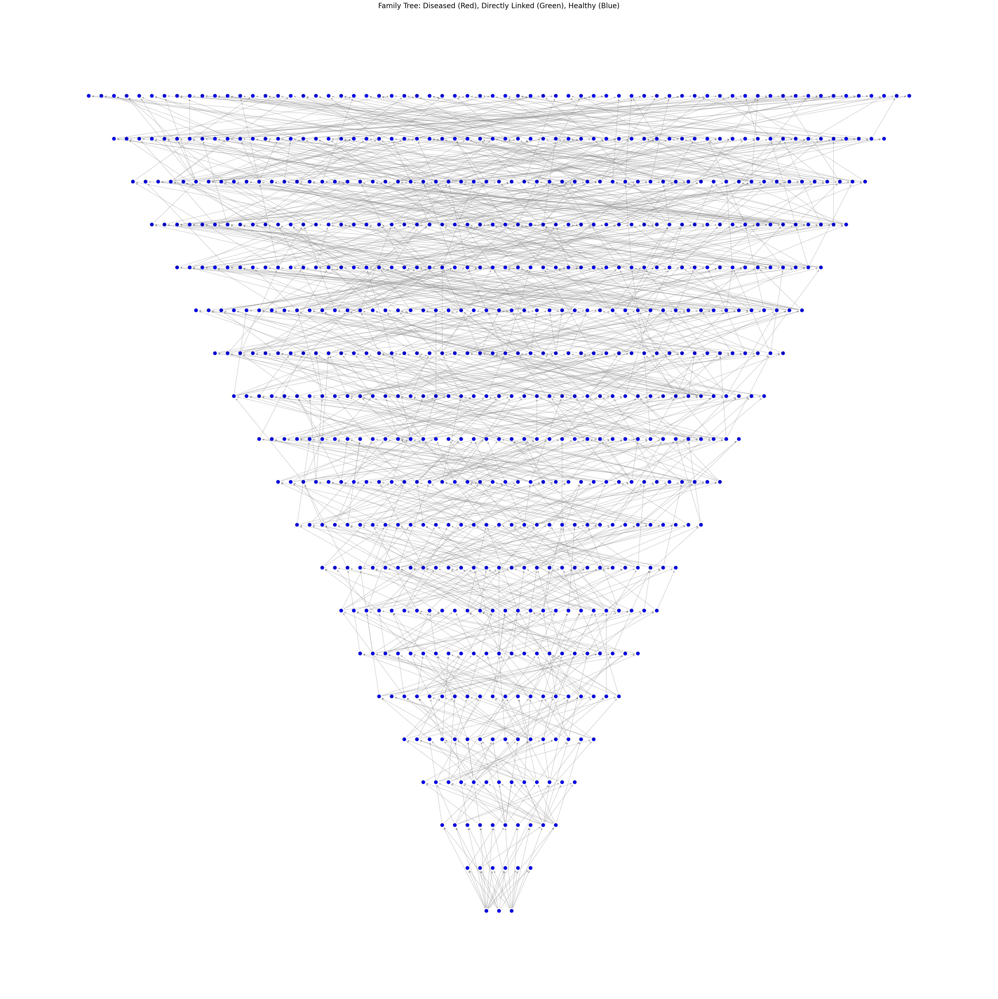

Final number of nodes in the graph: 687
Final number of edges in the graph: 1368


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm # Import colormaps
import numpy as np # For numerical operations

G = nx.DiGraph() # Initialize a directed graph

# --- Step 0: Identify Diseased and Directly Linked Individuals ---

# 0.1 Identify all diseased persons
diseased_person_ids = set(full_pop_data[full_pop_data['diseased'] == True]['person_ID'].unique())

# 0.2 Build a map of children for efficient lookup
children_map = {}
for index, row in full_pop_data.iterrows():
    child_id = row['person_ID']
    for parent_id in row['parents']:
        if parent_id not in children_map:
            children_map[parent_id] = []
        children_map[parent_id].append(child_id)

# 0.3 Identify individuals directly linked to a diseased person
linked_to_diseased_person_ids = set()
for person_id in diseased_person_ids:
    # Add parents of the diseased person
    parents_of_diseased = full_pop_data[full_pop_data['person_ID'] == person_id]['parents'].iloc[0]
    linked_to_diseased_person_ids.update(parents_of_diseased)

    # Add children of the diseased person
    if person_id in children_map:
        linked_to_diseased_person_ids.update(children_map[person_id])

# Ensure directly linked set does not include diseased persons themselves
linked_to_diseased_person_ids = linked_to_diseased_person_ids - diseased_person_ids


# --- Step 1: Add all individuals as nodes and store attributes ---
# Create a mapping for quick lookup of generation ID for parents
genealogy_lookup = full_pop_data.set_index('person_ID')

for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    person_id = row['person_ID']
    person_id_formatted = f"{person_id}_{gen_id_str}" # Create unique node ID
    is_diseased = row['diseased']

    # Extract numerical generation for gradient coloring
    numeric_gen_id = gen_id_str

    G.add_node(person_id_formatted,
               diseased=is_diseased,
               label=person_id_formatted,
               generation_str=gen_id_str, # Keep original string
               generation_num=numeric_gen_id,
               is_linked_to_diseased = person_id in linked_to_diseased_person_ids, # New attribute
               subset=numeric_gen_id) # Assign subset for multipartite_layout

# --- Step 2: Add parent-child relationships as edges ---
for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    child_id_raw = row['person_ID']
    child_id_formatted = f"{child_id_raw}_{gen_id_str}" # Formatted child ID

    parents = row['parents']
    for parent_id_raw in parents:
        if parent_id_raw in genealogy_lookup.index:
            parent_gen_id_str = genealogy_lookup.loc[parent_id_raw, 'Generation_ID'] # Get parent's generation ID from lookup
            formatted_parent_id = f"{parent_id_raw}_{parent_gen_id_str}" # Format parent ID

            if formatted_parent_id in G.nodes(): # Ensure parent node exists in our graph
                G.add_edge(formatted_parent_id, child_id_formatted) # Edge from parent to child

# --- Step 3: Filter out isolated generation 0 persons ---
initial_nodes_to_remove = []
for node in list(G.nodes()): # Iterate over a copy of nodes to allow modification
    node_data = G.nodes[node]
    if node_data['generation_str'] == 0 and G.degree(node) == 0:
        initial_nodes_to_remove.append(node)

if initial_nodes_to_remove:
    G.remove_nodes_from(initial_nodes_to_remove)
    print(f"Removed {len(initial_nodes_to_remove)} isolated generation 0 individuals.")

# --- Step 4: Visualize the filtered graph ---

# --- Apply Coloring (without gradient) ---
node_colors = []
for node in G.nodes():
    if G.nodes[node]['diseased']:
        node_colors.append('red')
    elif G.nodes[node]['is_linked_to_diseased']:
        node_colors.append('green')
    else:
        node_colors.append('blue')

# Generate node labels
node_labels = {node: node.split('_')[0] for node in G.nodes()} # Show only person_ID for clarity

plt.figure(figsize=(50, 50))
# Use multipartite_layout for linear arrangement by generation
pos = nx.multipartite_layout(G, subset_key='subset', align='horizontal') # 'subset' attribute defines layers

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=90) # Smaller nodes

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='gray', arrows=True, arrowsize=10, alpha=0.5)

# Draw labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=5, font_color='black') # Smaller font for readability

plt.title('Family Tree: Diseased (Red), Directly Linked (Green), Healthy (Blue)', size=20)
plt.axis('off') # Hide axes
plt.show()

print(f"Final number of nodes in the graph: {G.number_of_nodes()}")
print(f"Final number of edges in the graph: {G.number_of_edges()}")

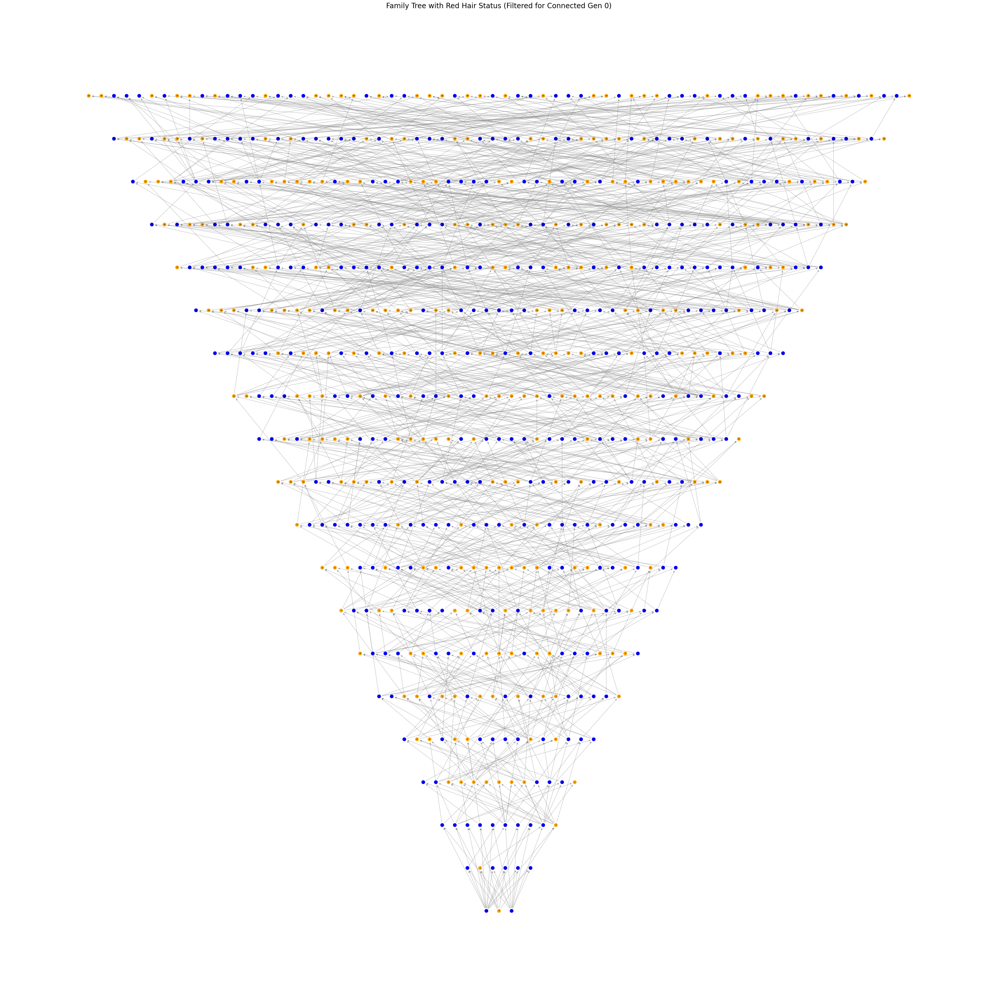

Final number of nodes in the graph: 687
Final number of edges in the graph: 1368


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm # Import colormaps
import numpy as np # For numerical operations

G = nx.DiGraph() # Initialize a directed graph

# --- Step 0: Identify individuals with Red hair ---
red_haired_person_ids = set(red_haired_df['person'].unique()) # Using the existing red_haired_df

# --- Step 1: Add all individuals as nodes and store attributes ---
# Create a mapping for quick lookup of generation ID for parents
genealogy_lookup = full_pop_data.set_index('person_ID')

for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    person_id = row['person_ID']
    person_id_formatted = f"{person_id}_{gen_id_str}" # Create unique node ID

    # Determine if the person has red hair
    has_red_hair = person_id in red_haired_person_ids

    # Extract numerical generation for gradient coloring
    numeric_gen_id = gen_id_str

    G.add_node(person_id_formatted,
               has_red_hair=has_red_hair, # New attribute
               label=person_id_formatted,
               generation_str=gen_id_str, # Keep original string
               generation_num=numeric_gen_id,
               subset=numeric_gen_id) # Assign subset for multipartite_layout

# --- Step 2: Add parent-child relationships as edges ---
for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    child_id_raw = row['person_ID']
    child_id_formatted = f"{child_id_raw}_{gen_id_str}" # Formatted child ID

    parents = row['parents']
    for parent_id_raw in parents:
        if parent_id_raw in genealogy_lookup.index:
            parent_gen_id_str = genealogy_lookup.loc[parent_id_raw, 'Generation_ID'] # Get parent's generation ID from lookup
            formatted_parent_id = f"{parent_id_raw}_{parent_gen_id_str}" # Format parent ID

            if formatted_parent_id in G.nodes(): # Ensure parent node exists in our graph
                G.add_edge(formatted_parent_id, child_id_formatted) # Edge from parent to child

# --- Step 3: Filter out isolated generation 0 persons ---
initial_nodes_to_remove = []
for node in list(G.nodes()): # Iterate over a copy of nodes to allow modification
    node_data = G.nodes[node]
    if node_data['generation_str'] == 0 and G.degree(node) == 0:
        initial_nodes_to_remove.append(node)

if initial_nodes_to_remove:
    G.remove_nodes_from(initial_nodes_to_remove)
    print(f"Removed {len(initial_nodes_to_remove)} isolated generation 0 individuals.")

# --- Step 4: Visualize the filtered graph ---

# --- Apply Coloring for Red Hair (without gradient) ---
node_colors = []
for node in G.nodes():
    if G.nodes[node]['has_red_hair']:
        node_colors.append('orange') # Fixed color for red hair
    else:
        node_colors.append('blue')   # Fixed color for no red hair

# Generate node labels
node_labels = {node: node.split('_')[0] for node in G.nodes()} # Show only person_ID for clarity

plt.figure(figsize=(50, 50))
# Use multipartite_layout for linear arrangement by generation
pos = nx.multipartite_layout(G, subset_key='subset', align='horizontal') # 'subset' attribute defines layers

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=90) # Smaller nodes

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='gray', arrows=True, arrowsize=10, alpha=0.5)

# Draw labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=5, font_color='black') # Smaller font for readability

plt.title('Family Tree with Red Hair Status (Filtered for Connected Gen 0)', size=20)
plt.axis('off') # Hide axes
plt.show()

print(f"Final number of nodes in the graph: {G.number_of_nodes()}")
print(f"Final number of edges in the graph: {G.number_of_edges()}")

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm # Import colormaps
import numpy as np # For numerical operations

G = nx.DiGraph() # Initialize a directed graph

# --- Step 0: Extract Intelligence scores ---
intelligence_scores_lookup = {}
for index, row in full_pop_data.iterrows():
    person_id = row['person_ID']
    # benign_trait_list is a dictionary, extract 'Intelligence' value
    benign_traits = row['benign_trait_list']
    # Get 'Intelligence' value, default to 0 if not present or if value is a string (due to binning by category_interpreter)
    # We need to access the original numerical value from full_pop_data's benign_trait_list
    # It seems the original full_pop_data was not being passed to category_interpreter, it was being used as a source
    # So, benign_trait_list in full_pop_data still holds the numerical values.
    intelligence_score = benign_traits.get('Intelligence', 0)
    # Ensure the value is numerical, if category_interpreter changed it to a string for some reason earlier steps should be checked.
    # Based on the problem description, 'the number is the value', so assuming numerical.
    if not isinstance(intelligence_score, (int, float)):
        # If it's already binned to 'average', 'above average', etc., map back to a numeric value for gradient
        if intelligence_score == 'average':
            intelligence_score = 0
        elif intelligence_score == 'above average':
            intelligence_score = 1 # Or a representative positive value
        elif intelligence_score == 'below average':
            intelligence_score = -1 # Or a representative negative value
        else:
            intelligence_score = 0 # Default if unknown string

    intelligence_scores_lookup[person_id] = intelligence_score

# Get min and max intelligence scores for normalization
all_intelligence_values = list(intelligence_scores_lookup.values())
min_intelligence = min(all_intelligence_values) if all_intelligence_values else 0
max_intelligence = max(all_intelligence_values) if all_intelligence_values else 0

# --- Step 1: Add all individuals as nodes and store attributes ---
# Create a mapping for quick lookup of generation ID for parents
genealogy_lookup = full_pop_data.set_index('person_ID')

for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    person_id = row['person_ID']
    person_id_formatted = f"{person_id}_{gen_id_str}" # Create unique node ID

    # Get intelligence score for the node
    intelligence_score = intelligence_scores_lookup.get(person_id, 0)

    # Extract numerical generation for grouping in layout
    numeric_gen_id = gen_id_str

    G.add_node(person_id_formatted,
               intelligence=intelligence_score, # New attribute
               label=person_id_formatted,
               generation_str=gen_id_str, # Keep original string
               generation_num=numeric_gen_id,
               subset=numeric_gen_id) # Assign subset for multipartite_layout

# --- Step 2: Add parent-child relationships as edges ---
for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    child_id_raw = row['person_ID']
    child_id_formatted = f"{child_id_raw}_{gen_id_str}" # Formatted child ID

    parents = row['parents']
    for parent_id_raw in parents:
        if parent_id_raw in genealogy_lookup.index:
            parent_gen_id_str = genealogy_lookup.loc[parent_id_raw, 'Generation_ID'] # Get parent's generation ID from lookup
            formatted_parent_id = f"{parent_id_raw}_{parent_gen_id_str}" # Format parent ID

            if formatted_parent_id in G.nodes(): # Ensure parent node exists in our graph
                G.add_edge(formatted_parent_id, child_id_formatted) # Edge from parent to child

# --- Step 3: Filter out isolated generation 0 persons ---
initial_nodes_to_remove = []
for node in list(G.nodes()): # Iterate over a copy of nodes to allow modification
    node_data = G.nodes[node]
    if node_data['generation_str'] == 0 and G.degree(node) == 0:
        initial_nodes_to_remove.append(node)

if initial_nodes_to_remove:
    G.remove_nodes_from(initial_nodes_to_remove)
    print(f"Removed {len(initial_nodes_to_remove)} isolated generation 0 individuals.")

# --- Step 4: Visualize the filtered graph ---

# --- Apply Gradient Coloring for Intelligence ---
# Choose a colormap for intelligence, e.g., 'viridis', 'plasma', 'coolwarm'
# 'coolwarm' is good for showing divergence around a mean (0)
cmap = cm.get_cmap('coolwarm')

node_colors = []
for node in G.nodes():
    score = G.nodes[node]['intelligence']

    # Normalize score to [0, 1] range for colormap
    if max_intelligence == min_intelligence: # Handle cases where all scores are the same
        normalized_score = 0.5
    else:
        normalized_score = (score - min_intelligence) / (max_intelligence - min_intelligence)

    node_colors.append(cmap(normalized_score))

# Generate node labels
node_labels = {node: node.split('_')[0] for node in G.nodes()} # Show only person_ID for clarity

plt.figure(figsize=(50, 50))
# Use multipartite_layout for linear arrangement by generation
pos = nx.multipartite_layout(G, subset_key='subset', align='horizontal') # 'subset' attribute defines layers

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=80) # Smaller nodes

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='grey', arrows=True, arrowsize=15, alpha=0.5)

# Draw labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=5, font_color='grey') # Smaller font for readability

plt.title('Family Tree with Intelligence Gradient (Filtered for Connected Gen 0)', size=20)
plt.axis('off') # Hide axes
plt.show()

print(f"Final number of nodes in the graph: {G.number_of_nodes()}")
print(f"Final number of edges in the graph: {G.number_of_edges()}")

C:\Users\nicol\AppData\Local\Temp\ipykernel_20948\1736385245.py:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('coolwarm')


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm # Import colormaps
import numpy as np # For numerical operations

G = nx.DiGraph() # Initialize a directed graph

# --- Step 0: Identify individuals with Huntington's Disease ---
huntington_person_ids = set()
for index, row in full_pop_data.iterrows():
    if 'Huntington' in row['Dominant patho.traits']:
        huntington_person_ids.add(row['person_ID'])

# --- Step 1: Add all individuals as nodes and store attributes ---
# Create a mapping for quick lookup of generation ID for parents
genealogy_lookup = full_pop_data.set_index('person_ID')

for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    person_id = row['person_ID']
    person_id_formatted = f"{person_id}_{gen_id_str}" # Create unique node ID

    # Determine if the person has Huntington's disease
    has_huntington = person_id in huntington_person_ids

    # Extract numerical generation for gradient coloring
    numeric_gen_id = gen_id_str

    G.add_node(person_id_formatted,
               has_huntington=has_huntington, # New attribute
               label=person_id_formatted,
               generation_str=gen_id_str, # Keep original string
               generation_num=numeric_gen_id,
               subset=numeric_gen_id) # Assign subset for multipartite_layout

# --- Step 2: Add parent-child relationships as edges ---
for index, row in full_pop_data.iterrows():
    gen_id_str = row['Generation_ID']
    child_id_raw = row['person_ID']
    child_id_formatted = f"{child_id_raw}_{gen_id_str}" # Formatted child ID

    parents = row['parents']
    for parent_id_raw in parents:
        if parent_id_raw in genealogy_lookup.index:
            parent_gen_id_str = genealogy_lookup.loc[parent_id_raw, 'Generation_ID'] # Get parent's generation ID from lookup
            formatted_parent_id = f"{parent_id_raw}_{parent_gen_id_str}" # Format parent ID

            if formatted_parent_id in G.nodes(): # Ensure parent node exists in our graph
                G.add_edge(formatted_parent_id, child_id_formatted) # Edge from parent to child

# --- Step 3: Filter out isolated generation 0 persons ---
initial_nodes_to_remove = []
for node in list(G.nodes()): # Iterate over a copy of nodes to allow modification
    node_data = G.nodes[node]
    if node_data['generation_str'] == 0 and G.degree(node) == 0:
        initial_nodes_to_remove.append(node)

if initial_nodes_to_remove:
    G.remove_nodes_from(initial_nodes_to_remove)
    print(f"Removed {len(initial_nodes_to_remove)} isolated generation 0 individuals.")

# --- Step 4: Visualize the filtered graph ---

# --- Apply Coloring for Huntington's Disease (without gradient) ---
node_colors = []
for node in G.nodes():
    if G.nodes[node]['has_huntington']:
        node_colors.append('red')
    else:
        node_colors.append('blue')

# Generate node labels
node_labels = {node: node.split('_')[0] for node in G.nodes()} # Show only person_ID for clarity

plt.figure(figsize=(50, 50))
# Use multipartite_layout for linear arrangement by generation
pos = nx.multipartite_layout(G, subset_key='subset', align='horizontal') # 'subset' attribute defines layers

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=90) # Smaller nodes

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='gray', arrows=True, arrowsize=10, alpha=0.5)

# Draw labels
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=5, font_color='black') # Smaller font for readability

plt.title('Family Tree with Huntington\'s Disease Status (Fixed Colors)', size=20)
plt.axis('off') # Hide axes
plt.show()

print(f"Final number of nodes in the graph: {G.number_of_nodes()}")
print(f"Final number of edges in the graph: {G.number_of_edges()}")